In [2]:
import pandas as pd
import geopandas as gpd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

### Timeseries of crime types

In [161]:
recent_df = pd.read_csv('data/MPS LSOA Level Crime (most recent 24 months).csv')
historical_df = pd.read_csv('data/MPS LSOA Level Crime (Historical).csv')

In [163]:
# Lets merge these two datasets
df = pd.merge(historical_df, recent_df, on=['LSOA Code', 'LSOA Name', 'Borough', 'Major Category', 'Minor Category'], how='outer').fillna(0).sort_index(axis = 1)
df

,201004,201005,201006,201007,201008,201009,201010,201011,201012,201101,...,202410,202411,202412,202501,Borough,LSOA Code,LSOA Name,Major Category,Minor Category,Refreshed Date
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,E09000002,E01000006,Barking and Dagenham 016A,ARSON AND CRIMINAL DAMAGE,ARSON,0
1,1.0,3.0,0.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,...,0.0,2.0,0.0,1.0,E09000002,E01000006,Barking and Dagenham 016A,ARSON AND CRIMINAL DAMAGE,CRIMINAL DAMAGE,05/02/2025
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,E09000002,E01000006,Barking and Dagenham 016A,BURGLARY,BURGLARY - RESIDENTIAL,05/02/2025
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,E09000002,E01000006,Barking and Dagenham 016A,BURGLARY,BURGLARY BUSINESS AND COMMUNITY,0
4,3.0,0.0,0.0,1.0,1.0,3.0,1.0,1.0,3.0,2.0,...,0.0,0.0,0.0,0.0,E09000002,E01000006,Barking and Dagenham 016A,BURGLARY,BURGLARY IN A DWELLING,05/02/2025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,E09000033,E01035722,Westminster 024G,VEHICLE OFFENCES,INTERFERING WITH A MOTOR VEHICLE,0
118815,1.0,1.0,0.0,0.0,2.0,0.0,0.0,3.0,3.0,0.0,...,0.0,0.0,0.0,0.0,E09000033,E01035722,Westminster 024G,VEHICLE OFFENCES,THEFT FROM A VEHICLE,05/02/2025
118816,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,2.0,E09000033,E01035722,Westminster 024G,VEHICLE OFFENCES,THEFT OR UNAUTH TAKING OF A MOTOR VEH,05/02/2025
118817,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,2.0,1.0,0.0,0.0,E09000033,E01035722,Westminster 024G,VIOLENCE AGAINST THE PERSON,VIOLENCE WITH INJURY,05/02/2025


In [5]:
df_yearly = df.copy()

# 获取所有的年份范围，假设是2014到2024年
years = range(2011, 2025)

# 对每一年进行循环，计算合计
for year in years:
    # 动态获取每一年的列名
    cols_to_sum = [col for col in df_yearly.columns if str(year) in str(col)]
    
    # 计算每一年合计的犯罪数量
    df_yearly[str(year)] = df_yearly[cols_to_sum].sum(axis=1)

# 创建包含每年数据的新的数据框
df_yearly = df_yearly[["LSOA Code", "Borough", "Major Category"] + [str(year) for year in years]]
df_yearly = df_yearly.groupby(['LSOA Code', "Borough", 'Major Category']).sum().reset_index()

# 显示结果
df_yearly

,LSOA Code,Borough,Major Category,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,E01000006,E09000002,ARSON AND CRIMINAL DAMAGE,4.0,9.0,5.0,8.0,8.0,8.0,5.0,12.0,7.0,6.0,5.0,6.0,5.0,5.0
1,E01000006,E09000002,BURGLARY,20.0,17.0,14.0,10.0,10.0,7.0,13.0,16.0,13.0,5.0,5.0,3.0,3.0,2.0
2,E01000006,E09000002,DRUG OFFENCES,10.0,1.0,6.0,8.0,6.0,1.0,3.0,14.0,6.0,25.0,16.0,17.0,5.0,3.0
3,E01000006,E09000002,MISCELLANEOUS CRIMES AGAINST SOCIETY,0.0,1.0,1.0,4.0,0.0,1.0,2.0,2.0,4.0,1.0,3.0,5.0,1.0,2.0
4,E01000006,E09000002,POSSESSION OF WEAPONS,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49782,E01035722,E09000033,PUBLIC ORDER OFFENCES,1.0,4.0,2.0,4.0,8.0,8.0,12.0,8.0,4.0,12.0,5.0,7.0,17.0,13.0
49783,E01035722,E09000033,ROBBERY,9.0,9.0,3.0,9.0,5.0,9.0,7.0,2.0,10.0,3.0,2.0,4.0,5.0,6.0
49784,E01035722,E09000033,THEFT,40.0,42.0,27.0,35.0,32.0,35.0,47.0,40.0,40.0,32.0,28.0,49.0,36.0,47.0
49785,E01035722,E09000033,VEHICLE OFFENCES,13.0,17.0,14.0,18.0,18.0,15.0,17.0,23.0,18.0,22.0,13.0,16.0,9.0,6.0


In [7]:
# Timeseries of each Major Category. What are trends of each major category like?
drop_list = ['LSOA Code', 'Borough']
grouped_yearly = df_yearly.groupby(by=['Major Category']).agg('sum').drop(columns=drop_list)
# 设置 "Major Category" 为索引
grouped_yearly.head()

,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
Major Category,,,,,,,,,,,,,,
ARSON AND CRIMINAL DAMAGE,75996.0,64730.0,54764.0,57314.0,61020.0,62106.0,61604.0,56324.0,55500.0,49982.0,51781.0,51942.0,56048.0,55138.0
BURGLARY,100836.0,97910.0,87187.0,75886.0,70489.0,68306.0,75975.0,80291.0,80362.0,60216.0,52318.0,51660.0,55434.0,52492.0
DRUG OFFENCES,64931.0,55755.0,50292.0,44400.0,39823.0,39592.0,36528.0,36084.0,47455.0,54571.0,45372.0,43358.0,38284.0,38063.0
MISCELLANEOUS CRIMES AGAINST SOCIETY,8768.0,8130.0,7727.0,8823.0,9979.0,11346.0,11190.0,11005.0,11143.0,11070.0,11130.0,11709.0,11003.0,10081.0
POSSESSION OF WEAPONS,5550.0,4286.0,3992.0,4322.0,4788.0,5843.0,7726.0,7685.0,7257.0,6725.0,5975.0,6278.0,6266.0,4522.0


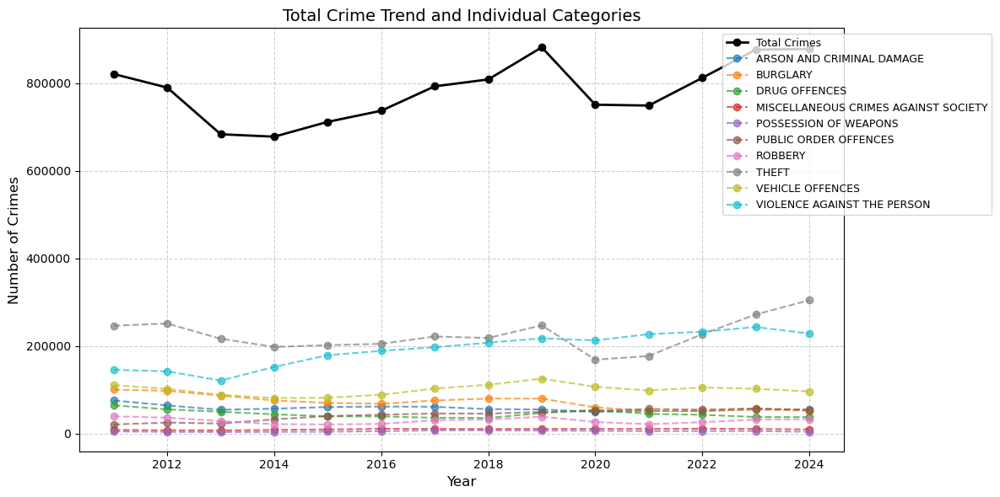

In [8]:
# 获取年份
years = grouped_yearly.columns.astype(int)

# 计算每年的犯罪总数
total_crimes = grouped_yearly.sum()

# 第一张图：总犯罪数量 + 各类别趋势
plt.figure(figsize=(12, 6))
plt.plot(years, total_crimes, marker='o', linestyle='-', color='black', linewidth=2, label='Total Crimes')

# 画出各单个犯罪类型的趋势
for category in grouped_yearly.index:
    plt.plot(years, grouped_yearly.loc[category], marker='o', linestyle='--', label=category, alpha=0.7)

plt.title("Total Crime Trend and Individual Categories", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Crimes", fontsize=12)
plt.legend(fontsize=9, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()


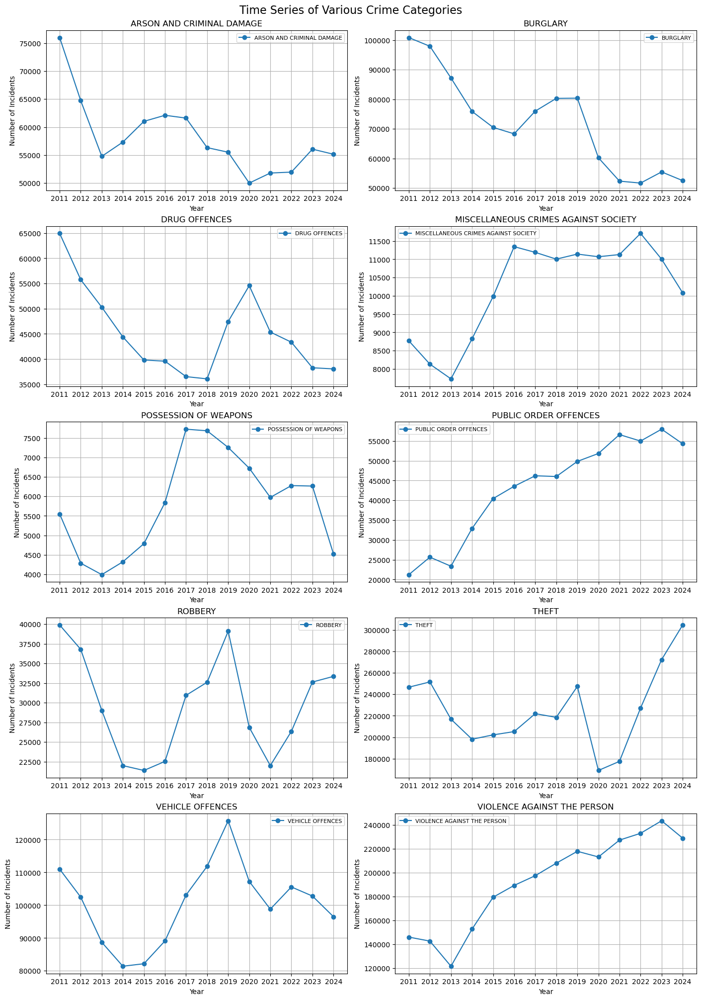

In [9]:
import matplotlib.pyplot as plt

# 确定子图的行列数
n_categories = len(grouped_yearly.index)  # 计算类别数
n_cols = 2  # 每行子图的列数
n_rows = (n_categories + n_cols - 1) // n_cols  # 计算需要的行数

# 创建子图网格
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 4 * n_rows), constrained_layout=True)
fig.suptitle("Time Series of Various Crime Categories", fontsize=16)

# 将 axes 扁平化，方便索引
axes = axes.flatten()

# 为每个类别生成单独的子图
for i, category in enumerate(grouped_yearly.index):
    ax = axes[i]
    ax.plot(grouped_yearly.columns, grouped_yearly.loc[category], marker='o', label=category)
    ax.set_title(category, fontsize=12)
    ax.set_xlabel("Year", fontsize=10)
    ax.set_ylabel("Number of Incidents", fontsize=10)
    ax.grid(visible=True)
    ax.legend(fontsize=8)

# 如果子图数量不满网格，隐藏多余的子图
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.show()


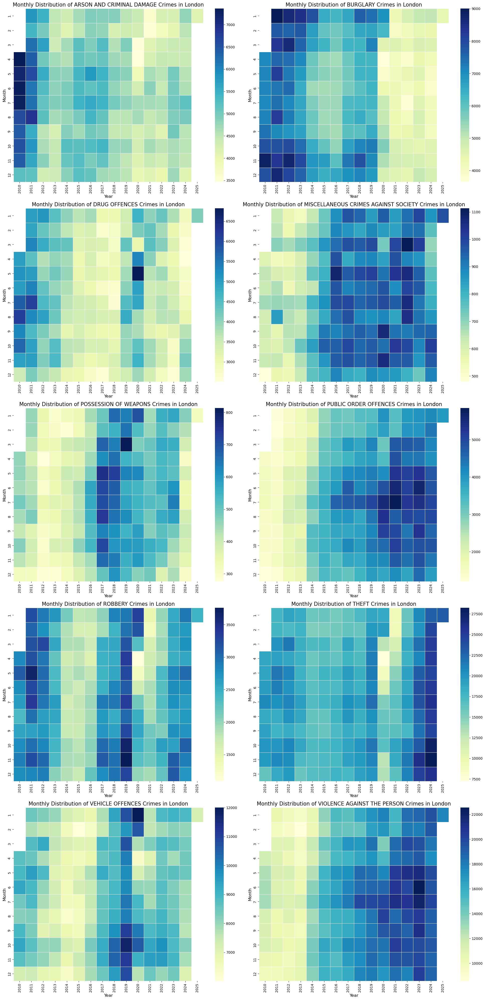

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 假设 df 是你的 DataFrame 数据

# 筛选数值列，排除非时间列
numeric_cols = df.select_dtypes(include=['number']).columns

# 获取所有的 Major Category
major_categories = df['Major Category'].unique()

# 计算子图布局
n_categories = len(major_categories)
n_rows = (n_categories + 1) // 2  # 保证能排满
fig, axes = plt.subplots(n_rows, 2, figsize=(20, 8 * n_rows))
axes = axes.flatten()  # 使axes为一维数组，方便索引

for i, cat in enumerate(major_categories):
    # 筛选当前类别的数据
    filtered_data = df[df['Major Category'] == cat]
    
    # 确保 numeric_cols 只包含数值列
    numeric_cols = filtered_data.select_dtypes(include=['number']).columns

    # 按时间（列名）聚合
    grouped = filtered_data[numeric_cols].sum()
    
    # 转换成 DataFrame 并拆分时间
    grouped_df = grouped.reset_index()
    grouped_df.columns = ['Date', 'Count']
    
    # 从 'Date' 列提取月份和年份
    grouped_df['Month'] = grouped_df['Date'].str[4:6]  # 提取月份
    grouped_df['Year'] = grouped_df['Date'].str[:4]  # 提取年份
    
    # 确保月份为整数并进行排序
    grouped_df['Month'] = grouped_df['Month'].astype(int)
    
    # 根据 'Year' 和 'Month' 进行透视
    monthly_pivot = grouped_df.pivot(index="Month", columns="Year", values="Count")
    
    # 填充缺失值
    monthly_pivot = monthly_pivot

    # 画热力图
    sns.heatmap(monthly_pivot, cmap="YlGnBu", linewidths=.5, ax=axes[i])
    axes[i].set_title(f'Monthly Distribution of {cat} Crimes in London', fontsize=15)
    axes[i].set_xlabel('Year', fontsize=12)
    axes[i].set_ylabel('Month', fontsize=12)

# 调整布局
plt.tight_layout()
plt.show()


### spatial plot

In [12]:
#load in the LSOA map 
UK_LSOA = gpd.read_file("./data/LSOA.gpkg")
UK_LSOA['area_km2'] = UK_LSOA.area*10**-6
UK_LSOA

,lsoa21cd,lsoa21nm,geometry,area_km2
0,E01000001,City of London 001A,"POLYGON ((532151.538 181867.433, 532152.5 1818...",0.129865
1,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",0.228420
2,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.25 182...",0.059054
3,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",0.189578
4,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537
...,...,...,...,...
4989,E01035718,Westminster 019G,"POLYGON ((528044.949 180617.984, 528046.344 18...",2.671900
4990,E01035719,Westminster 021F,"POLYGON ((530383.75 178784.828, 530376.55 1787...",0.140662
4991,E01035720,Westminster 021G,"POLYGON ((529856.151 178761.747, 529856.859 17...",0.151925
4992,E01035721,Westminster 023H,"POLYGON ((528641.815 178630.886, 528635.688 17...",0.216843


In [13]:
df_yearly[df_yearly['Major Category']=='THEFT']

,LSOA Code,Borough,Major Category,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
7,E01000006,E09000002,THEFT,12.0,7.0,5.0,5.0,3.0,8.0,9.0,15.0,6.0,11.0,10.0,12.0,13.0,13.0
17,E01000007,E09000002,THEFT,94.0,120.0,97.0,73.0,77.0,89.0,109.0,99.0,150.0,110.0,108.0,112.0,172.0,138.0
27,E01000008,E09000002,THEFT,37.0,29.0,17.0,77.0,82.0,43.0,42.0,37.0,53.0,36.0,49.0,27.0,41.0,19.0
37,E01000009,E09000002,THEFT,57.0,55.0,37.0,48.0,38.0,32.0,33.0,43.0,67.0,65.0,50.0,54.0,70.0,58.0
47,E01000011,E09000002,THEFT,16.0,14.0,14.0,7.0,1.0,13.0,8.0,10.0,10.0,12.0,13.0,7.0,12.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49744,E01035718,E09000033,THEFT,800.0,820.0,741.0,640.0,569.0,635.0,542.0,653.0,805.0,341.0,389.0,578.0,777.0,861.0
49754,E01035719,E09000033,THEFT,58.0,29.0,22.0,19.0,23.0,25.0,27.0,17.0,33.0,18.0,8.0,19.0,22.0,33.0
49764,E01035720,E09000033,THEFT,53.0,72.0,57.0,38.0,29.0,25.0,41.0,46.0,80.0,47.0,37.0,42.0,23.0,30.0
49774,E01035721,E09000033,THEFT,260.0,283.0,309.0,272.0,311.0,282.0,290.0,274.0,421.0,147.0,121.0,276.0,391.0,328.0


Final Cutpoints (by LSOA distribution): [ 19.1   39.09  67.63 113.23 196.06 391.12]


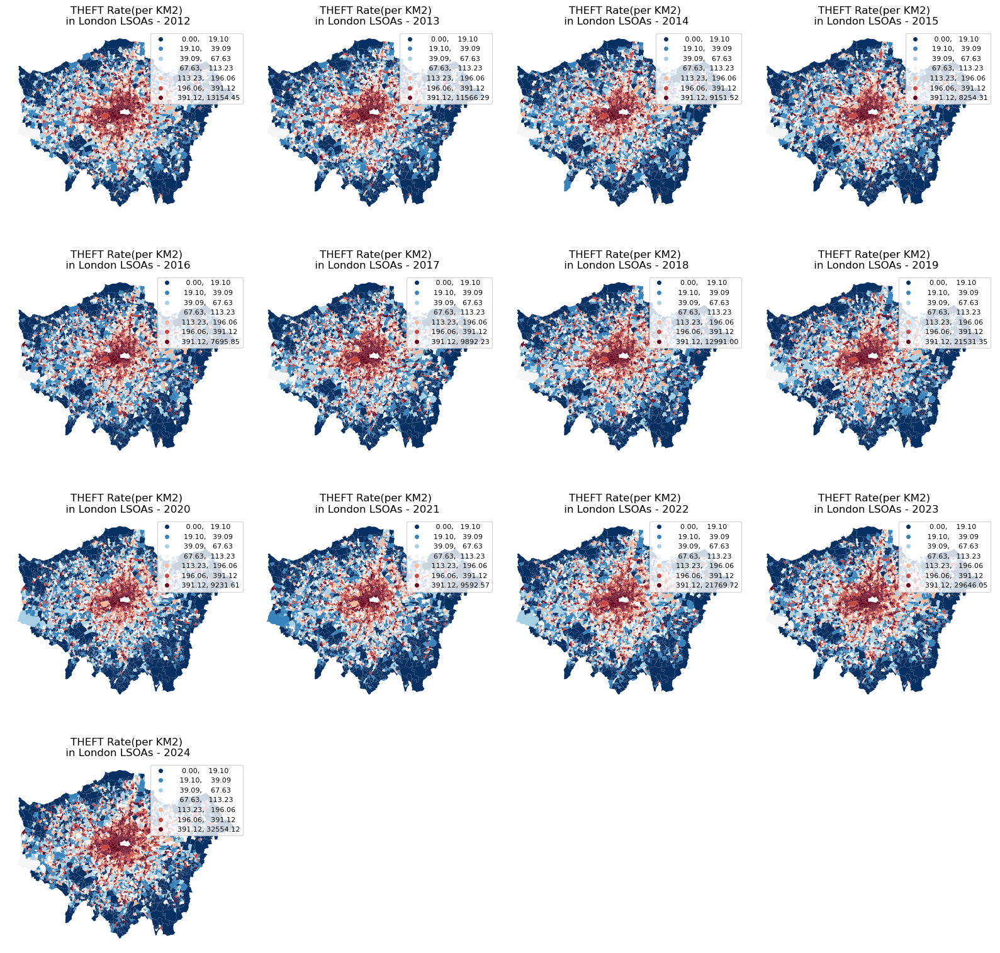

In [ ]:
# 选择要分析的犯罪类型
major_cat = 'THEFT'
filtered_data = df_yearly[df_yearly['Major Category'] == major_cat].copy()

# 合并地理数据
merged_cat = UK_LSOA.merge(filtered_data, left_on='lsoa21cd', right_on='LSOA Code', how='right').fillna(0)

# 计算每个 LSOA 归一化后的犯罪率（基于面积）
for year in years:
    merged_cat[f'{year}_area'] = merged_cat[str(year)] / merged_cat['area_km2']

# **计算 LSOA 的占比百分位**（按 LSOA 数量，而非值）
yearly_columns = merged_cat[[f'{year}_area' for year in years]].stack()

# **去除极端值（例如：异常大的犯罪率）**
# yearly_columns = yearly_columns[yearly_columns < yearly_columns.quantile(0.95)]  # 去除95%以上的极端值

# **基于 LSOA 占比计算 cutpoints**
n_quantiles = 7  # 5 个分组（可调整）
_, bins = pd.qcut(yearly_columns, q=n_quantiles, retbins=True, duplicates="drop")

# 确保 bins 唯一 & 合理
unique_cutpoints = np.unique(bins.round(2))

unique_cutpoints = unique_cutpoints[1:-1]

# **移除 bins[0] = 0.00，确保分层从第一个有效 cutpoint 开始**
# if unique_cutpoints[0] == 0.00 and len(unique_cutpoints) > 2:
#     unique_cutpoints = unique_cutpoints[1:]

print("Final Cutpoints (by LSOA distribution):", unique_cutpoints)  # 调试打印

# 计算年份数，并根据年份自动调整子图布局
num_years = len(years)
ncols = 4  # 每行 5 个
nrows = -(-num_years // ncols)  # 向上取整计算行数

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
axes = axes.flatten()

# 遍历年份绘制地图
for i, year in enumerate(years):
    ax = axes[i]
    year_str = f'{year}_area'  # 选择归一化列

    merged_cat.plot(
        column=year_str, cmap='RdBu_r', linewidth=0, ax=ax,
        legend=True, scheme='user_defined',
        classification_kwds={'bins': unique_cutpoints},
        legend_kwds={'fontsize': 8, 'markerscale': 0.5}  # 调整图例字体大小和标记符号大小
    )

    ax.set_title(f'{major_cat} Rate(per KM2)\n in London LSOAs - {year}', fontsize=12)
    ax.axis('off')

# 移除多余的空白子图
for i in range(num_years, len(axes)):
    fig.delaxes(axes[i])

# 调整子图间距
plt.subplots_adjust(hspace=0, wspace=0)  # 调整子图之间的垂直和水平间距

plt.tight_layout()
plt.show()


In [306]:
# 函数封装：用于绘制犯罪率分布图
def plot_crime_rate_by_lsoa(years, major_cat, n_quantiles=7, ncols=4):
    """
    Function to plot crime rate per LSOA for each year.
    
    Parameters:
    merged_cat: GeoDataFrame with merged data (geo data + crime data)
    years: List of years to plot.
    major_cat: Crime category to plot.
    n_quantiles: Number of quantiles to split crime rate distribution.
    ncols: Number of columns for subplot layout.
    """
    filtered_data = df_yearly[df_yearly['Major Category'] == major_cat].copy()

    # 合并地理数据
    merged_cat = UK_LSOA.merge(filtered_data, left_on='lsoa21cd', right_on='LSOA Code', how='left')

    # 计算每个 LSOA 归一化后的犯罪率（基于面积）
    for year in years:
        merged_cat[f'{year}_area'] = merged_cat[str(year)] / merged_cat['area_km2']

    # **计算 LSOA 的占比百分位**（按 LSOA 数量，而非值）
    yearly_columns = merged_cat[[f'{year}_area' for year in years]].stack().dropna()

    # 基于 LSOA 占比计算 cutpoints
    _, bins = pd.qcut(yearly_columns, q=n_quantiles, retbins=True, duplicates="drop")

    # 确保 bins 唯一 & 合理
    unique_cutpoints = np.unique(bins.round(2))
    unique_cutpoints = unique_cutpoints[1:-1]  # 移除 bins[0] = 0.00

    # 创建子图布局
    num_years = len(years)
    nrows = -(-num_years // ncols)  # 向上取整计算行数
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
    axes = axes.flatten()

    # 遍历年份绘制地图
    for i, year in enumerate(years):
        ax = axes[i]
        year_str = f'{year}_area'  # 选择归一化列

        merged_cat.plot(
            column=year_str, cmap='RdBu_r', linewidth=0, ax=ax,
            legend=True, scheme='user_defined',
            classification_kwds={'bins': unique_cutpoints},
            legend_kwds={'fontsize': 8, 'markerscale': 0.5, 'loc': 'lower right'},  # 调整图例字体大小和标记符号大小
            missing_kwds={'color': 'lightgrey', 'hatch': '///'}  # 渲染 NaN 为灰色并添加斜线
        )

        ax.set_title(f'{major_cat} Rate\n {year}  (count per KM2)', fontsize=12)
        ax.axis('off')

    # 移除多余的空白子图
    for i in range(num_years, len(axes)):
        fig.delaxes(axes[i])

    # 调整子图间距
    plt.subplots_adjust(hspace=0, wspace=0)  # 调整子图之间的垂直和水平间距
    plt.tight_layout()
    plt.show()

In [ ]:
years = ['2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024']
major_categories = df_yearly['Major Category'].unique()
for major_cat in major_categories:
  plot_crime_rate_by_lsoa(years, major_cat)

In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from esda.moran import Moran
from esda.getisord import G_Local
from libpysal.weights import Queen
import seaborn as sns

def calculate_spatial_statistics(major_cat, year):
    """
    计算 Moran's I 和 Getis-Ord G*，并绘制犯罪热点图。
    """
    # 筛选出对应的犯罪数据
    filtered_data = df_yearly[df_yearly['Major Category'] == major_cat].copy()

    # 使用 left 合并，保留所有数据
    merged_cat = UK_LSOA.merge(filtered_data, left_on='lsoa21cd', right_on='LSOA Code', how='left')

    # 计算每个区域的犯罪率（按每平方千米面积计算）
    merged_cat[f'{year}_area'] = merged_cat[str(year)] / merged_cat['area_km2']

    # 计算 Moran's I 时去除 NaN 数据
    merged_cat_no_nan = merged_cat.dropna(subset=[f'{year}_area'])  # 去掉含 NaN 的区域
    w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵
    w.transform = 'r'

    # 计算 Moran's I
    moran = Moran(merged_cat_no_nan[f'{year}_area'], w)
    print(f"Crime Type: {major_cat} - {year}")
    print(f"Moran's I: {moran.I:.4f}, p-value: {moran.p_norm:.4f}")

    # 计算 Getis-Ord G* 热点分析
    g_star = G_Local(merged_cat_no_nan[f'{year}_area'], w)
    merged_cat.loc[merged_cat_no_nan.index, f'Gi_{year}'] = g_star.Zs  # 保留原数据，插入 Gi 值

    # 自定义分类区间并绘制图形
    bins = [-2.0, -1.6, 0, 1.6, 2.0]  # 自定义分类区间

    # 绘制地图
    fig, ax = plt.subplots(figsize=(6, 4))
    merged_cat.plot(
        column=f'Gi_{year}', cmap='RdBu_r', linewidth=0.2, ax=ax, legend=True,
        scheme='user_defined', classification_kwds={'bins': bins},
        legend_kwds={'title': "Getis-Ord G* Z-score"},
        missing_kwds={'color': 'lightgrey', 'hatch': '///'}  # 渲染 NaN 为灰色并添加斜线
    )

    # 添加标题和移除坐标轴
    ax.set_title(f"Hotspot analysis ({major_cat}) - {year}", fontsize=16)
    ax.axis('off')

    # 显示图形
    plt.show()

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: ARSON AND CRIMINAL DAMAGE - 2024
Moran's I: 0.4206, p-value: 0.0000


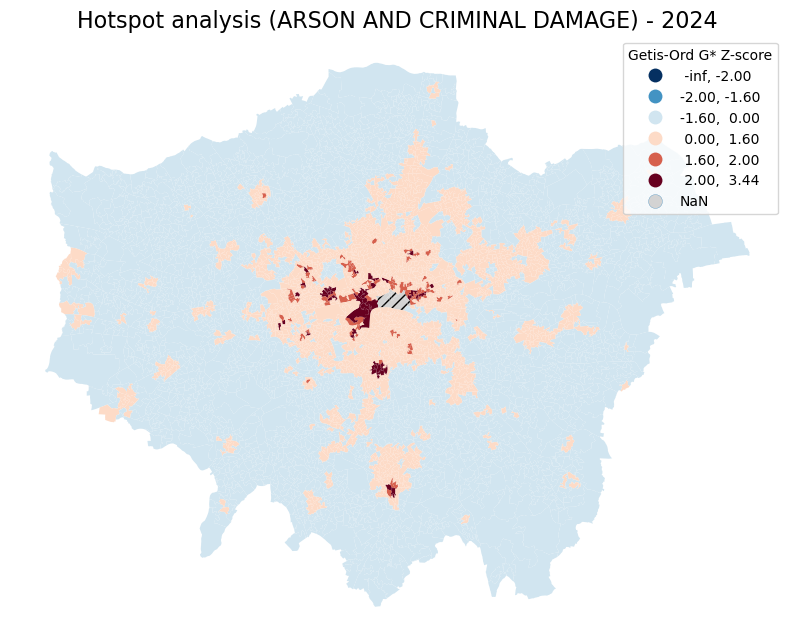

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: BURGLARY - 2024
Moran's I: 0.5232, p-value: 0.0000


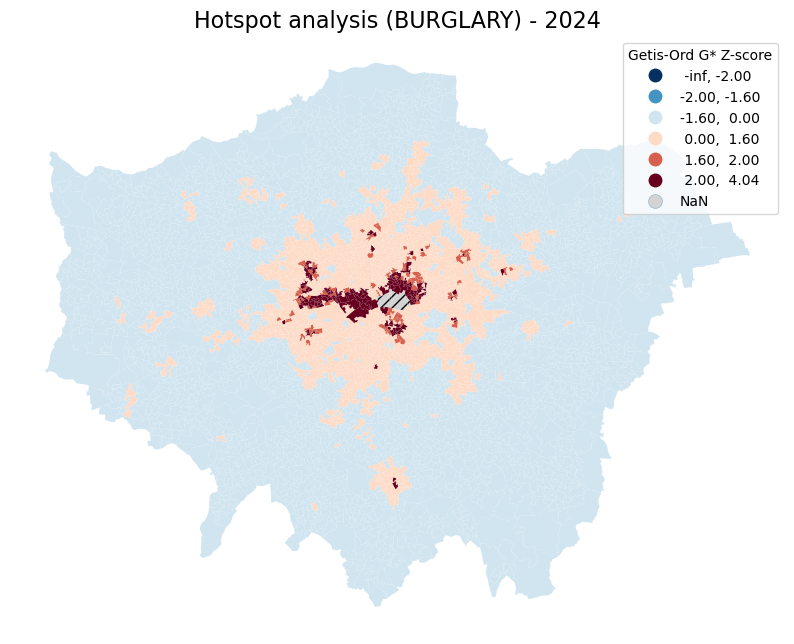

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: DRUG OFFENCES - 2024
Moran's I: 0.4159, p-value: 0.0000


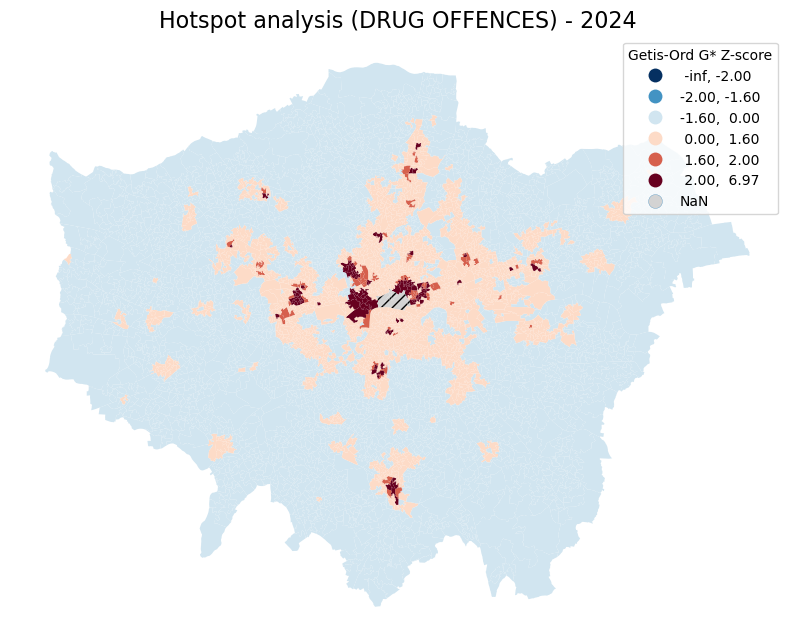

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: MISCELLANEOUS CRIMES AGAINST SOCIETY - 2024
Moran's I: 0.2138, p-value: 0.0000


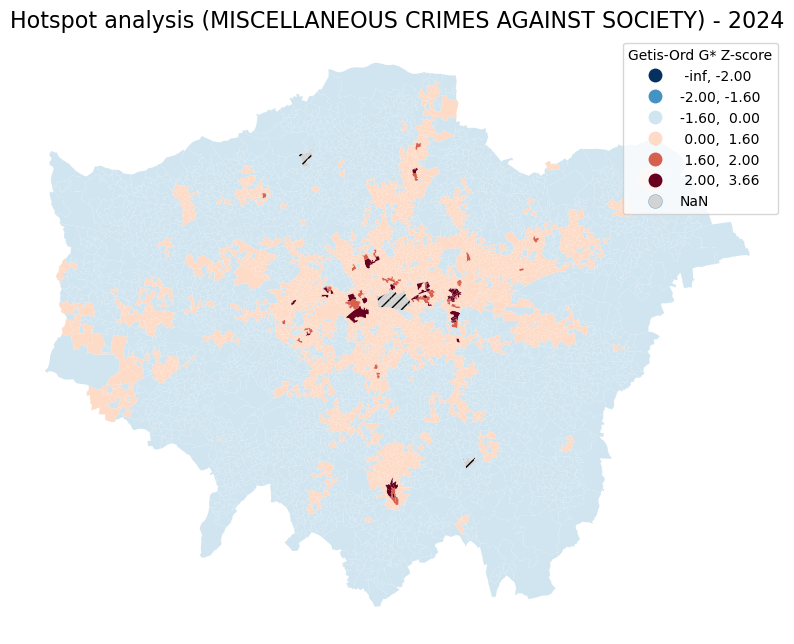

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: POSSESSION OF WEAPONS - 2024
Moran's I: 0.2371, p-value: 0.0000


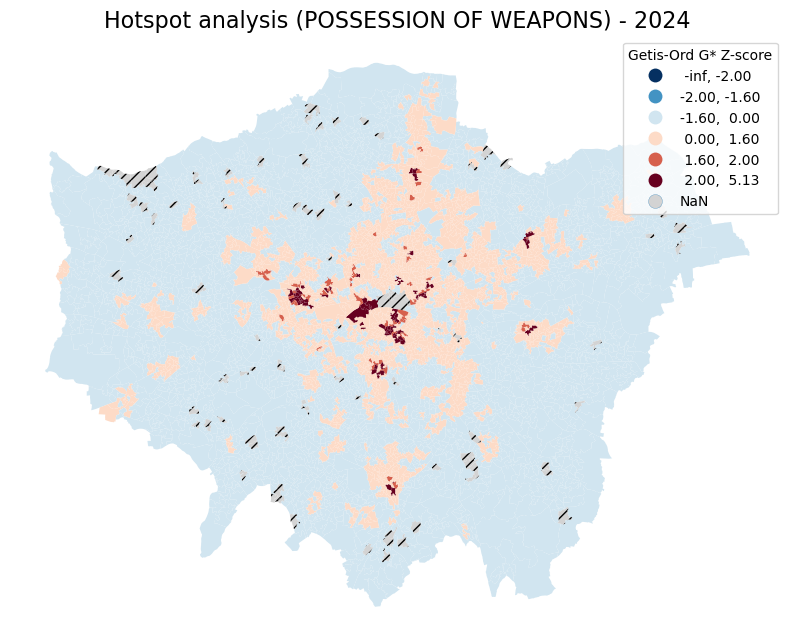

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: PUBLIC ORDER OFFENCES - 2024
Moran's I: 0.3758, p-value: 0.0000


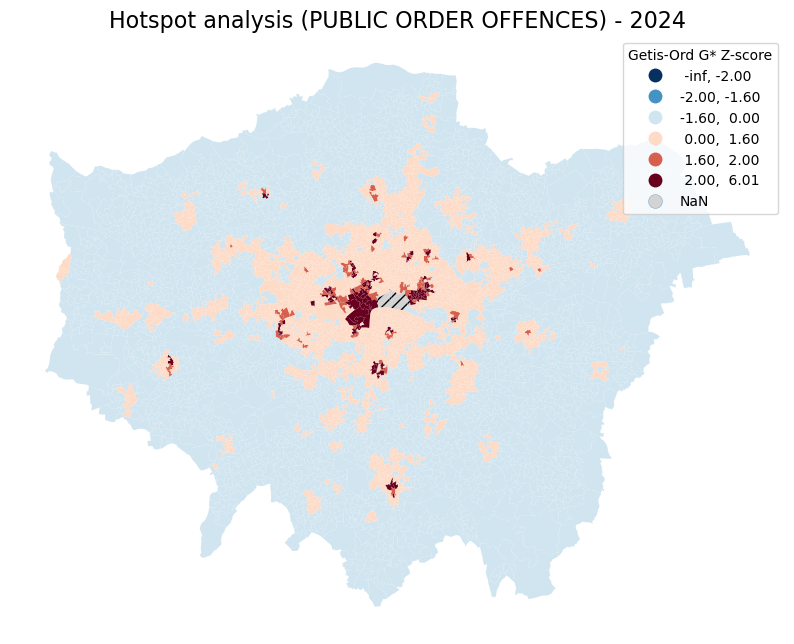

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: ROBBERY - 2024
Moran's I: 0.4602, p-value: 0.0000


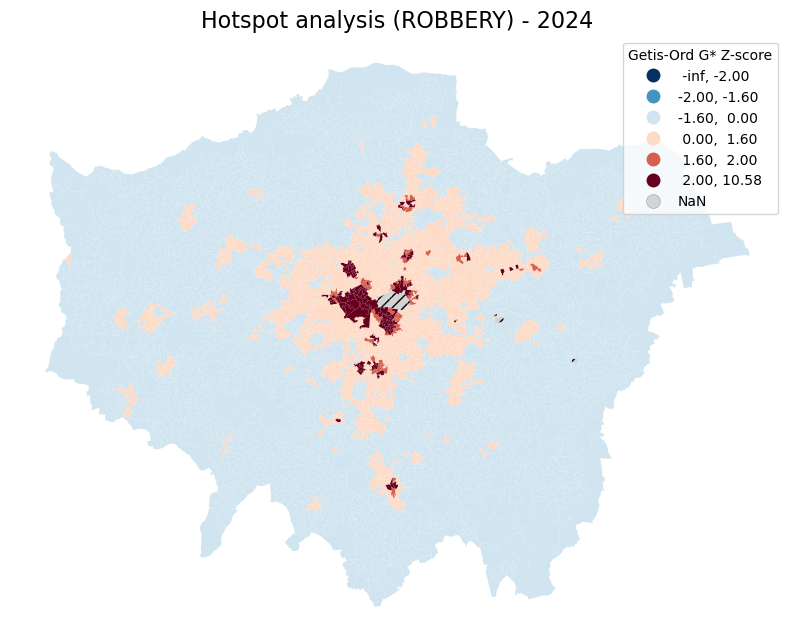

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: THEFT - 2024
Moran's I: 0.4674, p-value: 0.0000


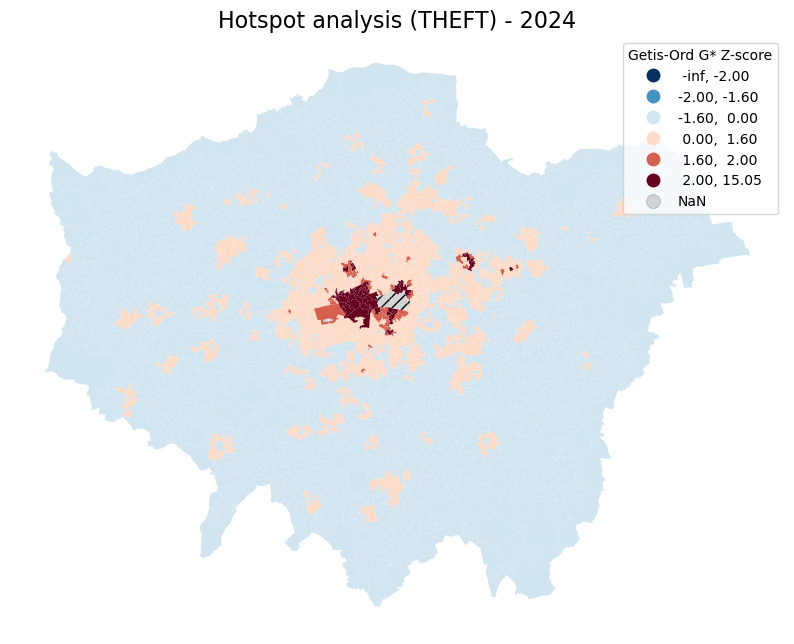

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: VEHICLE OFFENCES - 2024
Moran's I: 0.4949, p-value: 0.0000


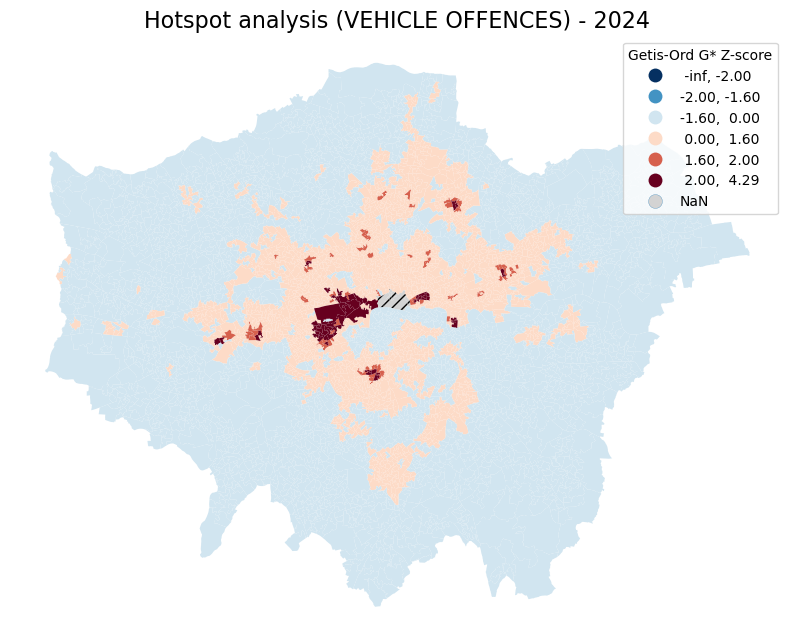

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\4152442612.py:25: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: VIOLENCE AGAINST THE PERSON - 2024
Moran's I: 0.4603, p-value: 0.0000


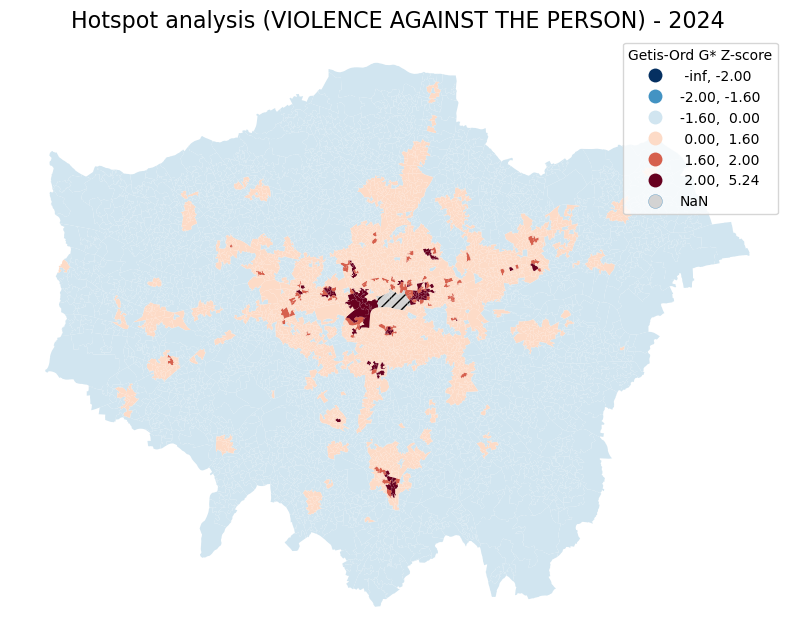

In [173]:
year_to_analyze = 2024
major_categories = df_yearly['Major Category'].unique()

for major_cat in major_categories:
  calculate_spatial_statistics(major_cat, year_to_analyze)

In [190]:
def for_all_types(lsoa_grouped_yearly, years, n_quantiles=7, ncols=4):
    # 合并地理数据
    merged_cat = UK_LSOA.merge(lsoa_grouped_yearly, left_on='lsoa21cd', right_on='LSOA Code', how='left')

    # 计算每个 LSOA 归一化后的犯罪率（基于面积）
    for year in years:
        merged_cat[f'{year}_area'] = merged_cat[str(year)] / merged_cat['area_km2']

    # **计算 LSOA 的占比百分位**（按 LSOA 数量，而非值）
    yearly_columns = merged_cat[[f'{year}_area' for year in years]].stack()

    # 基于 LSOA 占比计算 cutpoints
    _, bins = pd.qcut(yearly_columns, q=n_quantiles, retbins=True, duplicates="drop")

    # 确保 bins 唯一 & 合理
    unique_cutpoints = np.unique(bins.round(2))
    unique_cutpoints = unique_cutpoints[1:-1]  # 移除 bins[0] = 0.00

    # 创建子图布局
    num_years = len(years)
    nrows = -(-num_years // ncols)  # 向上取整计算行数
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
    axes = axes.flatten()

    # 遍历年份绘制地图
    for i, year in enumerate(years):
        ax = axes[i]
        year_str = f'{year}_area'  # 选择归一化列

        merged_cat.plot(
            column=year_str, cmap='RdBu_r', linewidth=0, ax=ax,
            legend=True, scheme='user_defined',
            classification_kwds={'bins': unique_cutpoints},
            legend_kwds={'fontsize': 8, 'markerscale': 0.5, 'loc': 'lower right'},  # 调整图例字体大小和标记符号大小
            missing_kwds={'color': 'lightgrey', 'hatch': '///'}  # 渲染 NaN 为灰色并添加斜线
        )

        ax.set_title(f'Total CrimeSum\n in London LSOAs - {year}  (per KM2)', fontsize=12)
        ax.axis('off')

    # 移除多余的空白子图
    for i in range(num_years, len(axes)):
        fig.delaxes(axes[i])

    # 调整子图间距
    plt.subplots_adjust(hspace=0, wspace=0)  # 调整子图之间的垂直和水平间距
    plt.tight_layout()
    plt.show()

In [ ]:
df_yearly

,LSOA Code,Borough,Major Category,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,E01000006,E09000002,ARSON AND CRIMINAL DAMAGE,4.0,9.0,5.0,8.0,8.0,8.0,5.0,12.0,7.0,6.0,5.0,6.0,5.0,5.0
1,E01000006,E09000002,BURGLARY,20.0,17.0,14.0,10.0,10.0,7.0,13.0,16.0,13.0,5.0,5.0,3.0,3.0,2.0
2,E01000006,E09000002,DRUG OFFENCES,10.0,1.0,6.0,8.0,6.0,1.0,3.0,14.0,6.0,25.0,16.0,17.0,5.0,3.0
3,E01000006,E09000002,MISCELLANEOUS CRIMES AGAINST SOCIETY,0.0,1.0,1.0,4.0,0.0,1.0,2.0,2.0,4.0,1.0,3.0,5.0,1.0,2.0
4,E01000006,E09000002,POSSESSION OF WEAPONS,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49782,E01035722,E09000033,PUBLIC ORDER OFFENCES,1.0,4.0,2.0,4.0,8.0,8.0,12.0,8.0,4.0,12.0,5.0,7.0,17.0,13.0
49783,E01035722,E09000033,ROBBERY,9.0,9.0,3.0,9.0,5.0,9.0,7.0,2.0,10.0,3.0,2.0,4.0,5.0,6.0
49784,E01035722,E09000033,THEFT,40.0,42.0,27.0,35.0,32.0,35.0,47.0,40.0,40.0,32.0,28.0,49.0,36.0,47.0
49785,E01035722,E09000033,VEHICLE OFFENCES,13.0,17.0,14.0,18.0,18.0,15.0,17.0,23.0,18.0,22.0,13.0,16.0,9.0,6.0


In [183]:
# Timeseries of each Major Category. What are trends of each major category like?
drop_list = ['Major Category', 'Borough']
lsoa_grouped_yearly = df_yearly.groupby(by=['LSOA Code']).agg('sum').drop(columns=drop_list)
# 设置 "Major Category" 为索引
lsoa_grouped_yearly

,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
LSOA Code,,,,,,,,,,,,,,
E01000006,107.0,100.0,93.0,73.0,82.0,79.0,95.0,113.0,108.0,103.0,94.0,119.0,87.0,89.0
E01000007,403.0,366.0,312.0,269.0,385.0,370.0,442.0,387.0,519.0,529.0,507.0,473.0,647.0,521.0
E01000008,178.0,130.0,131.0,176.0,196.0,180.0,172.0,194.0,213.0,192.0,224.0,210.0,234.0,135.0
E01000009,337.0,278.0,222.0,234.0,241.0,183.0,189.0,248.0,270.0,292.0,298.0,294.0,376.0,243.0
E01000011,113.0,108.0,81.0,99.0,70.0,108.0,95.0,101.0,91.0,107.0,111.0,103.0,121.0,115.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
E01035718,1436.0,1349.0,1204.0,1096.0,1051.0,1229.0,1199.0,1293.0,1915.0,1040.0,1090.0,1364.0,1636.0,1678.0
E01035719,109.0,65.0,50.0,52.0,76.0,70.0,64.0,70.0,102.0,65.0,55.0,76.0,64.0,93.0
E01035720,86.0,121.0,108.0,89.0,71.0,93.0,113.0,110.0,135.0,97.0,92.0,105.0,83.0,82.0


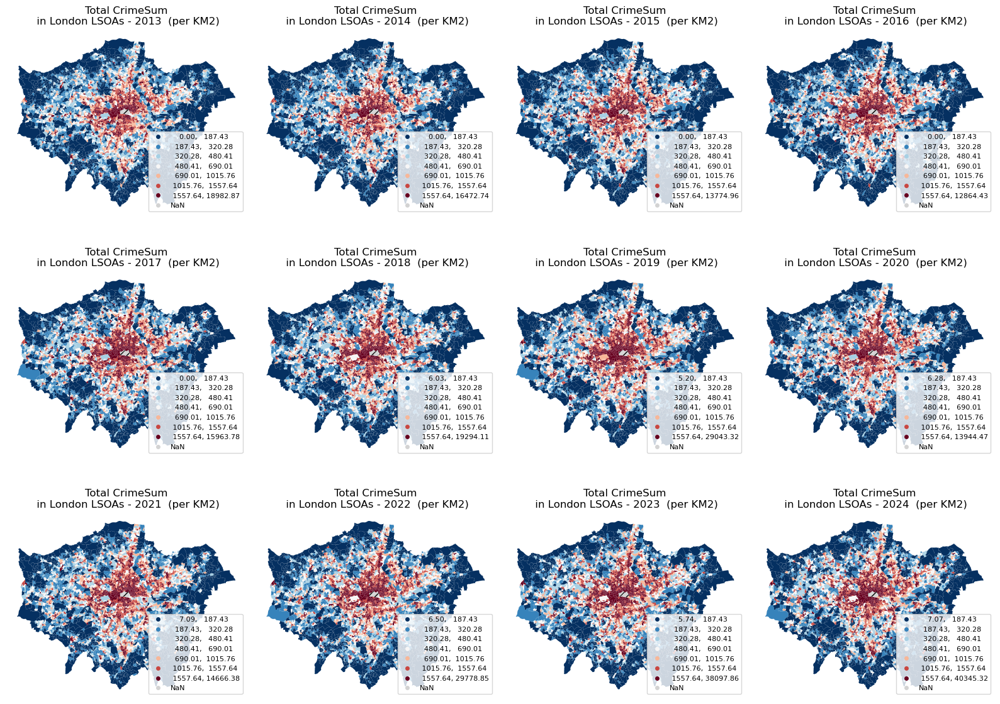

In [191]:
for_all_types(lsoa_grouped_yearly, years)

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\1949990683.py:9: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵


Crime Type: VIOLENCE AGAINST THE PERSON - 2024
Moran's I: 0.5040, p-value: 0.0000


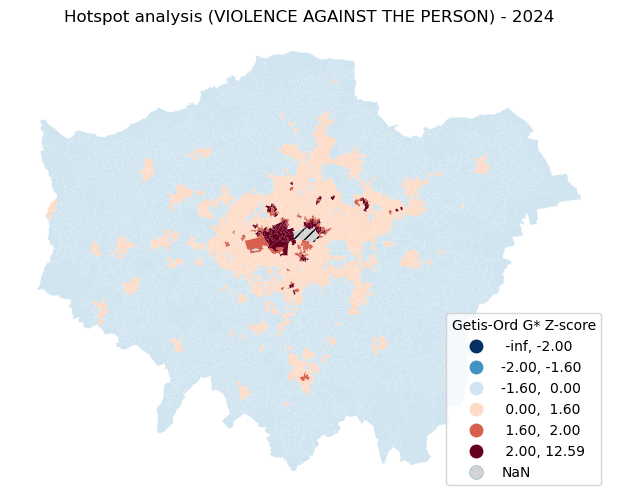

In [189]:
# 使用 left 合并，保留所有数据
merged_cat = UK_LSOA.merge(lsoa_grouped_yearly, left_on='lsoa21cd', right_on='LSOA Code', how='left')

# 计算每个区域的犯罪率（按每平方千米面积计算）
merged_cat[f'{year}_area'] = merged_cat[str(year)] / merged_cat['area_km2']

# 计算 Moran's I 时去除 NaN 数据
merged_cat_no_nan = merged_cat.dropna(subset=[f'{year}_area'])  # 去掉含 NaN 的区域
w = Queen.from_dataframe(merged_cat_no_nan)  # 用没有 NaN 的数据来构建权重矩阵
w.transform = 'r'

# 计算 Moran's I
moran = Moran(merged_cat_no_nan[f'{year}_area'], w)
print(f"Crime Type: {major_cat} - {year}")
print(f"Moran's I: {moran.I:.4f}, p-value: {moran.p_norm:.4f}")

# 计算 Getis-Ord G* 热点分析
g_star = G_Local(merged_cat_no_nan[f'{year}_area'], w)
merged_cat.loc[merged_cat_no_nan.index, f'Gi_{year}'] = g_star.Zs  # 保留原数据，插入 Gi 值

# 自定义分类区间并绘制图形
bins = [-2.0, -1.6, 0, 1.6, 2.0]  # 自定义分类区间

# 绘制地图
fig, ax = plt.subplots(figsize=(9, 6))
merged_cat.plot(
  column=f'Gi_{year}', cmap='RdBu_r', linewidth=0.2, ax=ax, legend=True,
  scheme='user_defined', classification_kwds={'bins': bins},
  legend_kwds={'title': "Getis-Ord G* Z-score", 'loc': 'lower right'},
  missing_kwds={'color': 'lightgrey', 'hatch': '///'}  # 渲染 NaN 为灰色并添加斜线
)

# 添加标题和移除坐标轴
ax.set_title(f"Hotspot analysis ({major_cat}) - {year}", fontsize=12)
ax.axis('off')

# 显示图形
plt.show()

## Cluster analysis

In [279]:
crime19 = df_yearly[["LSOA Code", "Major Category", "2019"]]
crime14 = df_yearly[["LSOA Code", "Major Category", "2014"]]


In [280]:
crime19 = crime19.pivot_table(index= 'LSOA Code', columns = 'Major Category', 
                                    values = "2019", fill_value = 0).reset_index()
#then rename the axis
crime19.rename_axis(None, axis=1, inplace=True)
#extract the columns to sum
cols_to_sum = [col for col in crime19.columns if "LSOA" not in col]
#sum across the columns rather than rows
crime19['Total_crime'] = 0
#sum across the columns rather than rows
crime19["Total_crime"] = crime19[cols_to_sum].sum(axis=1)
for col in cols_to_sum:
    crime19[col] = (crime19[col] / crime19["Total_crime"]).round(4)
london_crime19 = UK_LSOA.merge(crime19, left_on="lsoa21cd", right_on="LSOA Code", how="right").drop(columns='LSOA Code')
# 计算每个区域的面积，单位为平方公里
london_crime19['crime_per_km2'] = london_crime19['Total_crime'] / london_crime19['area_km2']
london_crime19.head()


,lsoa21cd,lsoa21nm,geometry,area_km2,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime,crime_per_km2
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537,0.0648,0.1204,0.0556,0.0370,0.0000,0.0463,0.1019,0.0556,0.1296,0.3889,108.0,737.015246
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.200094,0.0405,0.0385,0.1291,0.0116,0.0116,0.0559,0.1118,0.2890,0.0617,0.2505,519.0,2593.781018
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.216901,0.0704,0.0798,0.0798,0.0141,0.0000,0.0657,0.0282,0.2488,0.1878,0.2254,213.0,982.013054
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.127960,0.0519,0.0519,0.0852,0.0074,0.0037,0.0593,0.1148,0.2481,0.0741,0.3037,270.0,2110.035582
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.091632,0.0879,0.0440,0.0879,0.0110,0.0000,0.0110,0.0440,0.1099,0.1319,0.4725,91.0,993.099795


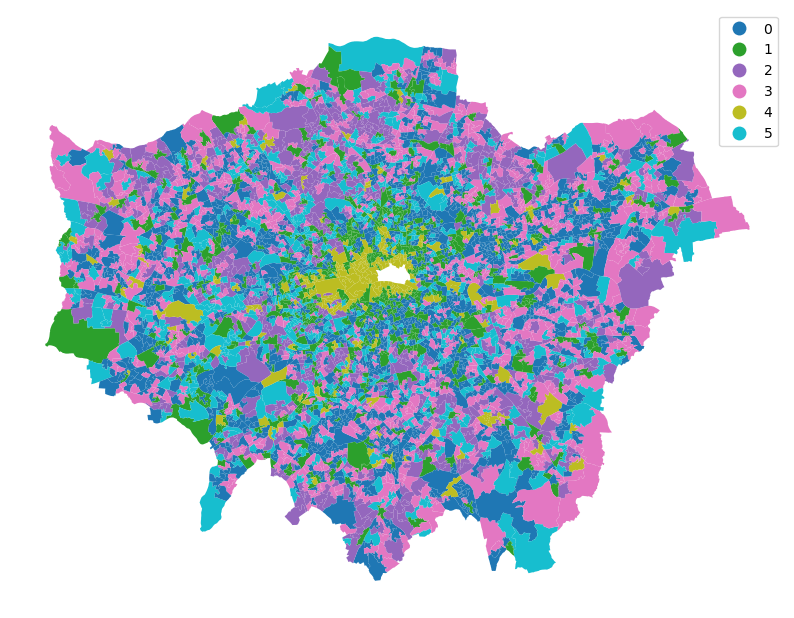

In [291]:
#import the necessary module
from sklearn.cluster import AgglomerativeClustering
#extract the values that we want to plot
crime_clus = london_crime19[cols_to_sum]
#create the model that we want, setting the linkage to ward, the distance threshold to 4 and 
#set the number of clusters to none so that we can plot the dendrogram afterwards
model = AgglomerativeClustering(linkage="ward", distance_threshold = 4, n_clusters=None)

#fit the model to the data
model.fit(crime_clus)

#将聚类结果添加到原数据集
london_crime19["Aggl_clus"] = model.labels_

fig, ax = plt.subplots(figsize = (10,10))

london_crime19.plot(column = "Aggl_clus", categorical = True, legend=True, ax=ax)

ax.set_axis_off()

In [292]:
agglom_means =london_crime19.groupby("Aggl_clus")[cols_to_sum].mean()
agglom_means

,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON
Aggl_clus,,,,,,,,,,
0,0.082723,0.089255,0.068820,0.015679,0.009981,0.065877,0.041144,0.141207,0.127661,0.357648
1,0.054271,0.093785,0.056321,0.010740,0.008569,0.063585,0.051561,0.326599,0.111528,0.223037
2,0.066041,0.179615,0.030451,0.009915,0.004568,0.039796,0.028733,0.104903,0.348241,0.187733
3,0.088047,0.127526,0.048857,0.014544,0.007739,0.050899,0.030500,0.089658,0.218472,0.323747
4,0.036067,0.067027,0.036373,0.007086,0.004942,0.046978,0.042940,0.535333,0.079973,0.143269
5,0.075566,0.130424,0.042116,0.011947,0.007932,0.056887,0.039774,0.196285,0.207159,0.231904


In [300]:
# DataFrame 转置（即行列互换），然后对所有数值保留三位小数。
agglom_means_T = agglom_means.T.round(3)
#agglom_means_T.reset_index(inplace=True)
agglom_means_T = pd.DataFrame(agglom_means_T)
agglom_means_T

Aggl_clus,0,1,2,3,4,5
ARSON AND CRIMINAL DAMAGE,0.083,0.054,0.066,0.088,0.036,0.076
BURGLARY,0.089,0.094,0.180,0.128,0.067,0.130
DRUG OFFENCES,0.069,0.056,0.030,0.049,0.036,0.042
MISCELLANEOUS CRIMES AGAINST SOCIETY,0.016,0.011,0.010,0.015,0.007,0.012
POSSESSION OF WEAPONS,0.010,0.009,0.005,0.008,0.005,0.008
PUBLIC ORDER OFFENCES,0.066,0.064,0.040,0.051,0.047,0.057
ROBBERY,0.041,0.052,0.029,0.031,0.043,0.040
THEFT,0.141,0.327,0.105,0.090,0.535,0.196
VEHICLE OFFENCES,0.128,0.112,0.348,0.218,0.080,0.207
VIOLENCE AGAINST THE PERSON,0.358,0.223,0.188,0.324,0.143,0.232


C:\Users\YU\AppData\Local\Temp\ipykernel_43784\284881416.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\284881416.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\284881416.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\284881416.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labe

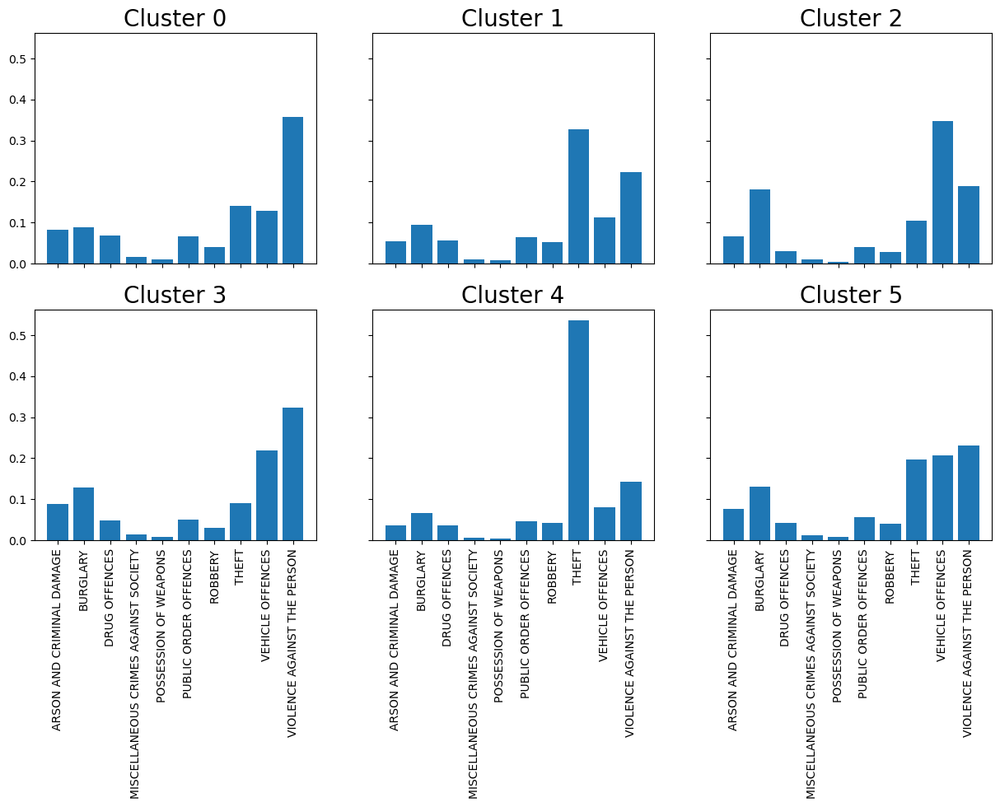

In [301]:
agglom_means_T.reset_index(inplace=True)

#get the colours
# colors = ["blue", "red", "pink", "tab:cyan"]

#create subplots for each cluster
fig, ax = plt.subplots(2,3, figsize = (15,8), sharey = True, sharex = True)
#flatten the axis
axis = ax.flatten()

#going over each column
for i, col  in enumerate(agglom_means_T.columns):
    #ignore the index column
    if col != "index":
        ax = axis[i-1]
        #plot the bar chart
        ax.bar(height = agglom_means_T[col], x=agglom_means_T["index"] )
        #rotate the x-ticks
        ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
        #set the title
        ax.set_title(f"Cluster {col}", fontsize = 20)

In [286]:
agglom_sizes = london_crime19.groupby("Aggl_clus").size()
agglom_sizes

Aggl_clus
0    3335
1     933
2     720
dtype: int64

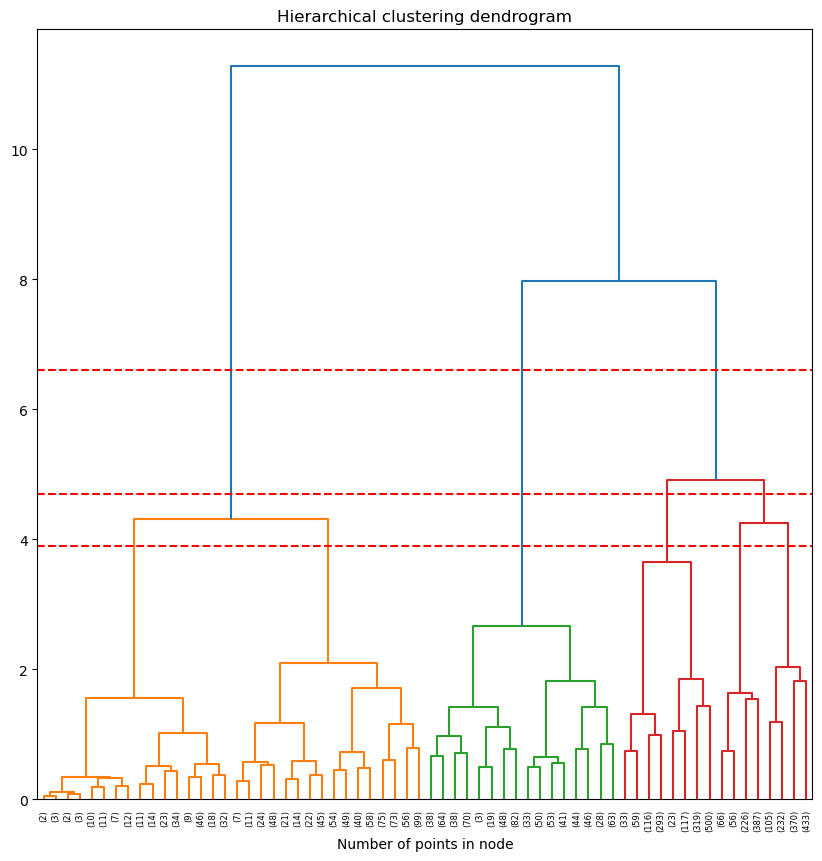

In [290]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count +=1
            else:
                current_count += counts[child_idx-n_samples]
        counts[i] = current_count
        
    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                    counts]).astype(float)
    
    dendrogram(linkage_matrix, **kwargs)

fig, ax = plt.subplots(figsize = (10,10))
ax.set_title("Hierarchical clustering dendrogram")
#plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=5)
plt.axhline(y = 3.9, color = "r", linestyle = "--")
plt.axhline(y = 4.7, color = "r", linestyle = "--")
plt.axhline(y = 6.6, color = "r", linestyle = "--")
ax.set_xlabel("Number of points in node")
plt.show()

In [281]:
crime14 = crime14.pivot_table(index= 'LSOA Code', columns = 'Major Category', 
                                    values = "2014", fill_value = 0).reset_index()
#then rename the axis
crime14.rename_axis(None, axis=1, inplace=True)
#extract the columns to sum
cols_to_sum = [col for col in crime14.columns if "LSOA" not in col]
#sum across the columns rather than rows
crime14['Total_crime'] = 0
#sum across the columns rather than rows
crime14["Total_crime"] = crime14[cols_to_sum].sum(axis=1)
for col in cols_to_sum:
    crime14[col] = (crime14[col] / crime14["Total_crime"]).round(4)
london_crime14 = UK_LSOA.merge(crime14, left_on="lsoa21cd", right_on="LSOA Code", how="right").drop(columns='LSOA Code')
# 计算每个区域的面积，单位为平方公里
london_crime14['crime_per_km2'] = london_crime14['Total_crime'] / london_crime14['area_km2']
london_crime14.head()


,lsoa21cd,lsoa21nm,geometry,area_km2,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime,crime_per_km2
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537,0.1096,0.1370,0.1096,0.0548,0.0137,0.0000,0.0411,0.0685,0.2192,0.2466,73.0,498.167713
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.200094,0.1115,0.0372,0.0855,0.0186,0.0000,0.0929,0.0372,0.2714,0.0335,0.3123,269.0,1344.368196
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.216901,0.0455,0.0341,0.0511,0.0284,0.0114,0.0170,0.0114,0.4375,0.1080,0.2557,176.0,811.428627
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.127960,0.0470,0.0214,0.2265,0.0427,0.0043,0.0556,0.0641,0.2051,0.0214,0.3120,234.0,1828.697504
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.091632,0.0808,0.1414,0.0202,0.0303,0.0101,0.0505,0.0505,0.0707,0.1111,0.4343,99.0,1080.405272


In [ ]:
crime24 = df_yearly[["LSOA Code", "Major Category", "2024"]]
crime24 


,LSOA Code,Major Category,2024
0,E01000006,ARSON AND CRIMINAL DAMAGE,5.0
1,E01000006,BURGLARY,2.0
2,E01000006,DRUG OFFENCES,3.0
3,E01000006,MISCELLANEOUS CRIMES AGAINST SOCIETY,2.0
4,E01000006,POSSESSION OF WEAPONS,2.0
...,...,...,...
49782,E01035722,PUBLIC ORDER OFFENCES,13.0
49783,E01035722,ROBBERY,6.0
49784,E01035722,THEFT,47.0
49785,E01035722,VEHICLE OFFENCES,6.0


In [195]:
crime24 = crime24.pivot_table(index= 'LSOA Code', columns = 'Major Category', 
                                    values = "2024", fill_value = 0).reset_index()
#then rename the axis
crime24.rename_axis(None, axis=1, inplace=True)
crime24

,LSOA Code,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON
0,E01000006,5.0,2.0,3.0,2.0,2.0,6.0,6.0,13.0,21.0,29.0
1,E01000007,32.0,22.0,63.0,2.0,4.0,42.0,46.0,138.0,16.0,156.0
2,E01000008,10.0,4.0,6.0,0.0,0.0,7.0,6.0,19.0,22.0,61.0
3,E01000009,24.0,12.0,15.0,3.0,2.0,12.0,14.0,58.0,22.0,81.0
4,E01000011,11.0,5.0,8.0,4.0,0.0,5.0,5.0,15.0,8.0,54.0
...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,62.0,23.0,98.0,4.0,7.0,95.0,84.0,861.0,203.0,241.0
4984,E01035719,6.0,2.0,4.0,0.0,0.0,7.0,6.0,33.0,3.0,32.0
4985,E01035720,3.0,5.0,1.0,1.0,1.0,7.0,3.0,30.0,8.0,23.0
4986,E01035721,32.0,22.0,11.0,3.0,1.0,26.0,25.0,328.0,23.0,115.0


In [196]:
#extract the columns to sum
cols_to_sum = [col for col in crime24.columns if "LSOA" not in col]
#sum across the columns rather than rows
crime24['Total_crime'] = 0
#sum across the columns rather than rows
crime24["Total_crime"] = crime24[cols_to_sum].sum(axis=1)
crime24

,LSOA Code,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime
0,E01000006,5.0,2.0,3.0,2.0,2.0,6.0,6.0,13.0,21.0,29.0,89.0
1,E01000007,32.0,22.0,63.0,2.0,4.0,42.0,46.0,138.0,16.0,156.0,521.0
2,E01000008,10.0,4.0,6.0,0.0,0.0,7.0,6.0,19.0,22.0,61.0,135.0
3,E01000009,24.0,12.0,15.0,3.0,2.0,12.0,14.0,58.0,22.0,81.0,243.0
4,E01000011,11.0,5.0,8.0,4.0,0.0,5.0,5.0,15.0,8.0,54.0,115.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,62.0,23.0,98.0,4.0,7.0,95.0,84.0,861.0,203.0,241.0,1678.0
4984,E01035719,6.0,2.0,4.0,0.0,0.0,7.0,6.0,33.0,3.0,32.0,93.0
4985,E01035720,3.0,5.0,1.0,1.0,1.0,7.0,3.0,30.0,8.0,23.0,82.0
4986,E01035721,32.0,22.0,11.0,3.0,1.0,26.0,25.0,328.0,23.0,115.0,586.0


In [197]:
#we then want to turn the previous columns into percentages
#do this by dividing over the total crime columns
for col in cols_to_sum:
    crime24[col] = (crime24[col] / crime24["Total_crime"]).round(4)

In [198]:
crime24

,LSOA Code,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime
0,E01000006,0.0562,0.0225,0.0337,0.0225,0.0225,0.0674,0.0674,0.1461,0.2360,0.3258,89.0
1,E01000007,0.0614,0.0422,0.1209,0.0038,0.0077,0.0806,0.0883,0.2649,0.0307,0.2994,521.0
2,E01000008,0.0741,0.0296,0.0444,0.0000,0.0000,0.0519,0.0444,0.1407,0.1630,0.4519,135.0
3,E01000009,0.0988,0.0494,0.0617,0.0123,0.0082,0.0494,0.0576,0.2387,0.0905,0.3333,243.0
4,E01000011,0.0957,0.0435,0.0696,0.0348,0.0000,0.0435,0.0435,0.1304,0.0696,0.4696,115.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,0.0369,0.0137,0.0584,0.0024,0.0042,0.0566,0.0501,0.5131,0.1210,0.1436,1678.0
4984,E01035719,0.0645,0.0215,0.0430,0.0000,0.0000,0.0753,0.0645,0.3548,0.0323,0.3441,93.0
4985,E01035720,0.0366,0.0610,0.0122,0.0122,0.0122,0.0854,0.0366,0.3659,0.0976,0.2805,82.0
4986,E01035721,0.0546,0.0375,0.0188,0.0051,0.0017,0.0444,0.0427,0.5597,0.0392,0.1962,586.0


In [200]:
london_crime24 = UK_LSOA.merge(crime24, left_on="lsoa21cd", right_on="LSOA Code", how="right").drop(columns='LSOA Code')
# 计算每个区域的面积，单位为平方公里
london_crime24['crime_per_km2'] = london_crime24['Total_crime'] / london_crime24['area_km2']
london_crime24.head()


,lsoa21cd,lsoa21nm,geometry,area_km2,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime,crime_per_km2
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537,0.0562,0.0225,0.0337,0.0225,0.0225,0.0674,0.0674,0.1461,0.2360,0.3258,89.0,607.355157
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.200094,0.0614,0.0422,0.1209,0.0038,0.0077,0.0806,0.0883,0.2649,0.0307,0.2994,521.0,2603.776320
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.216901,0.0741,0.0296,0.0444,0.0000,0.0000,0.0519,0.0444,0.1407,0.1630,0.4519,135.0,622.402640
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.127960,0.0988,0.0494,0.0617,0.0123,0.0082,0.0494,0.0576,0.2387,0.0905,0.3333,243.0,1899.032024
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.091632,0.0957,0.0435,0.0696,0.0348,0.0000,0.0435,0.0435,0.1304,0.0696,0.4696,115.0,1255.016224


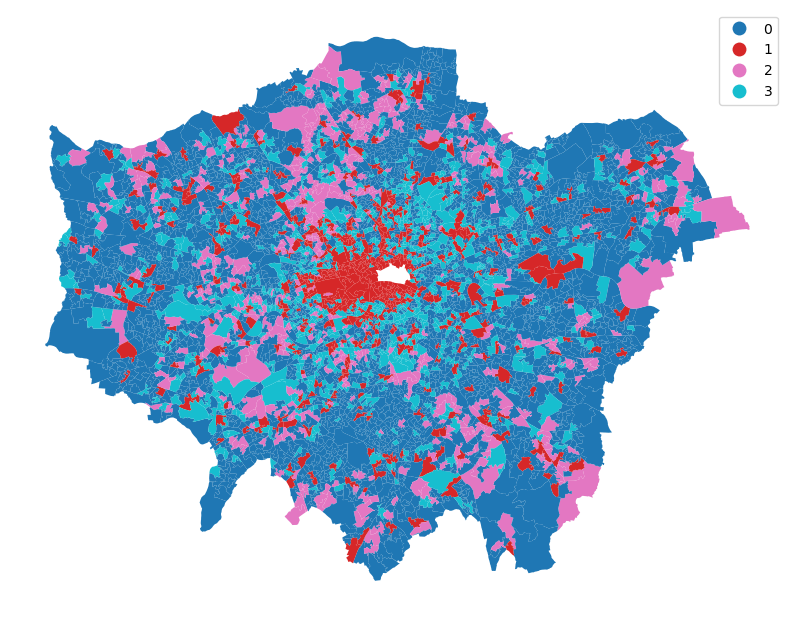

In [202]:
#import the necessary module
from sklearn.cluster import AgglomerativeClustering
#extract the values that we want to plot
crime_clus = london_crime24[cols_to_sum]
#create the model that we want, setting the linkage to ward, the distance threshold to 4 and 
#set the number of clusters to none so that we can plot the dendrogram afterwards
model = AgglomerativeClustering(linkage="ward", distance_threshold = 5, n_clusters=None)

#fit the model to the data
model.fit(crime_clus)

#将聚类结果添加到原数据集
london_crime24["Aggl_clus"] = model.labels_

fig, ax = plt.subplots(figsize = (10,10))

london_crime24.plot(column = "Aggl_clus", categorical = True, legend=True, ax=ax)

ax.set_axis_off()

In [203]:
agglom_means =london_crime24.groupby("Aggl_clus")[cols_to_sum].mean()
agglom_means

,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON
Aggl_clus,,,,,,,,,,
0,0.089161,0.072024,0.052964,0.015514,0.006208,0.065615,0.027413,0.141143,0.160058,0.369894
1,0.045738,0.056090,0.031443,0.006310,0.004086,0.055368,0.044585,0.512533,0.066545,0.177303
2,0.077237,0.137811,0.035239,0.012672,0.003406,0.047817,0.021757,0.147417,0.302309,0.214333
3,0.066313,0.071007,0.045404,0.010138,0.005513,0.071195,0.043453,0.300252,0.125580,0.261142


In [209]:
# DataFrame 转置（即行列互换），然后对所有数值保留三位小数。
agglom_means_T = agglom_means.T.round(3)
#agglom_means_T.reset_index(inplace=True)
agglom_means_T = pd.DataFrame(agglom_means_T)
agglom_means_T

Aggl_clus,0,1,2,3
ARSON AND CRIMINAL DAMAGE,0.089,0.046,0.077,0.066
BURGLARY,0.072,0.056,0.138,0.071
DRUG OFFENCES,0.053,0.031,0.035,0.045
MISCELLANEOUS CRIMES AGAINST SOCIETY,0.016,0.006,0.013,0.010
POSSESSION OF WEAPONS,0.006,0.004,0.003,0.006
PUBLIC ORDER OFFENCES,0.066,0.055,0.048,0.071
ROBBERY,0.027,0.045,0.022,0.043
THEFT,0.141,0.513,0.147,0.300
VEHICLE OFFENCES,0.160,0.067,0.302,0.126
VIOLENCE AGAINST THE PERSON,0.370,0.177,0.214,0.261


C:\Users\YU\AppData\Local\Temp\ipykernel_43784\2910956105.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\2910956105.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\2910956105.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\2910956105.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(

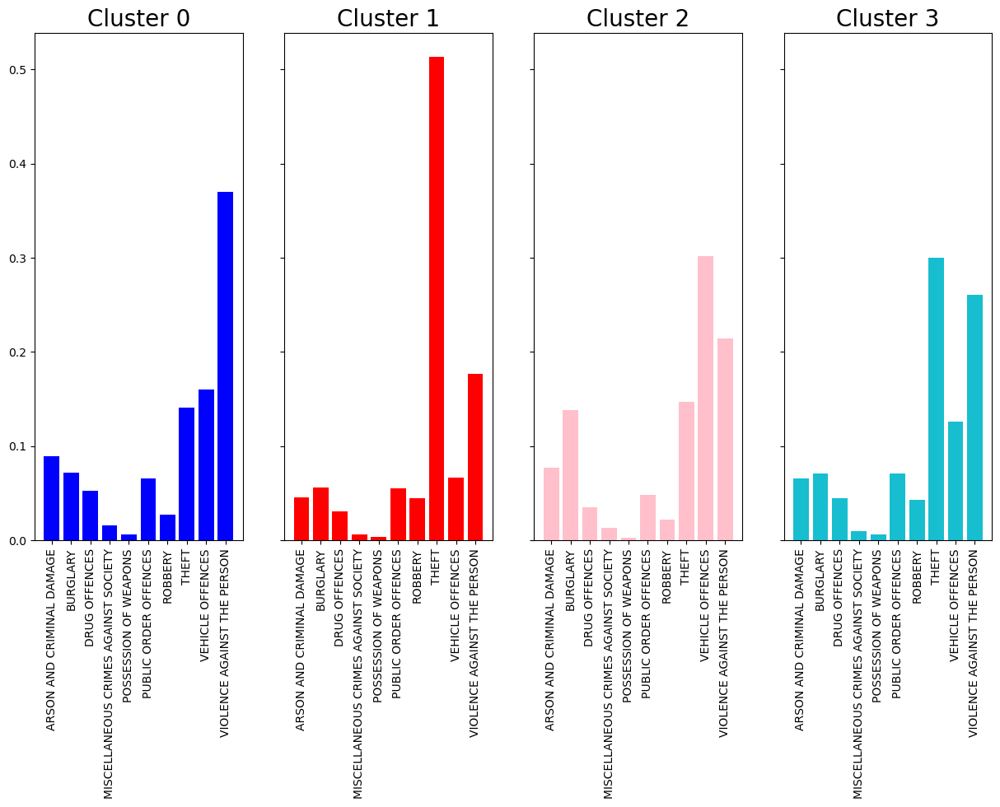

In [210]:
agglom_means_T.reset_index(inplace=True)

#get the colours
colors = ["blue", "red", "pink", "tab:cyan"]

#create subplots for each cluster
fig, ax = plt.subplots(1,4, figsize = (15,8), sharey = True, sharex = True)
#flatten the axis
axis = ax.flatten()

#going over each column
for i, col  in enumerate(agglom_means_T.columns):
    #ignore the index column
    if col != "index":
        ax = axis[i-1]
        #plot the bar chart
        ax.bar(height = agglom_means_T[col], x=agglom_means_T["index"], color = colors[i-1] )
        #rotate the x-ticks
        ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
        #set the title
        ax.set_title(f"Cluster {col}", fontsize = 20)

In [212]:
agglom_sizes = london_crime24.groupby("Aggl_clus").size()
agglom_sizes

Aggl_clus
0    2849
1     645
2     560
3     934
dtype: int64

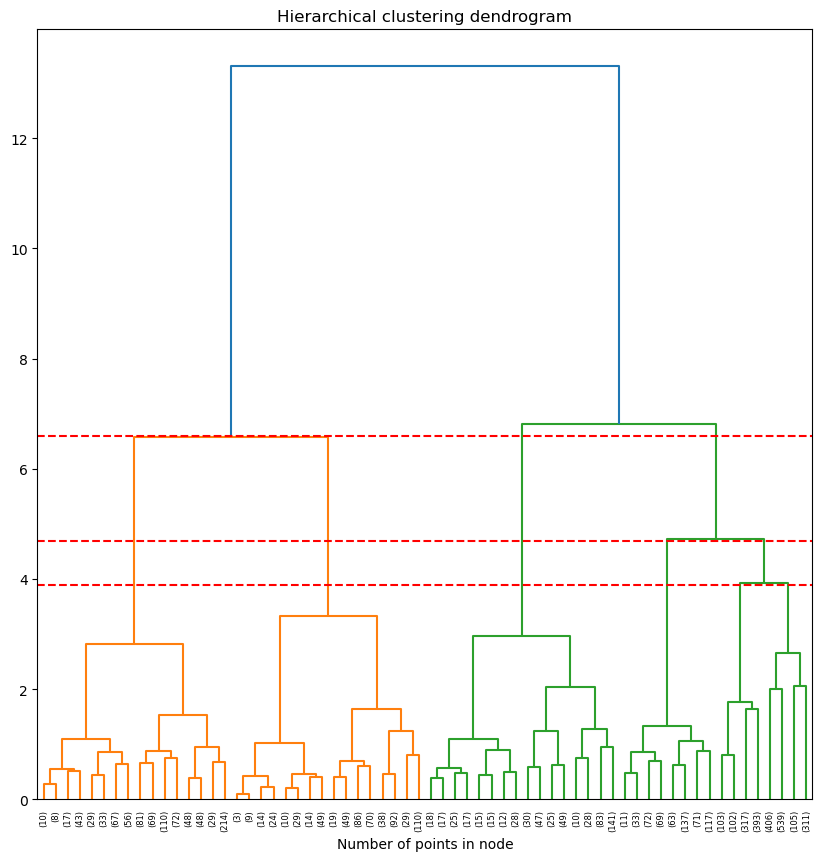

In [222]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count +=1
            else:
                current_count += counts[child_idx-n_samples]
        counts[i] = current_count
        
    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                    counts]).astype(float)
    
    dendrogram(linkage_matrix, **kwargs)

fig, ax = plt.subplots(figsize = (10,10))
ax.set_title("Hierarchical clustering dendrogram")
#plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=5)
plt.axhline(y = 3.9, color = "r", linestyle = "--")
plt.axhline(y = 4.7, color = "r", linestyle = "--")
plt.axhline(y = 6.6, color = "r", linestyle = "--")
ax.set_xlabel("Number of points in node")
plt.show()

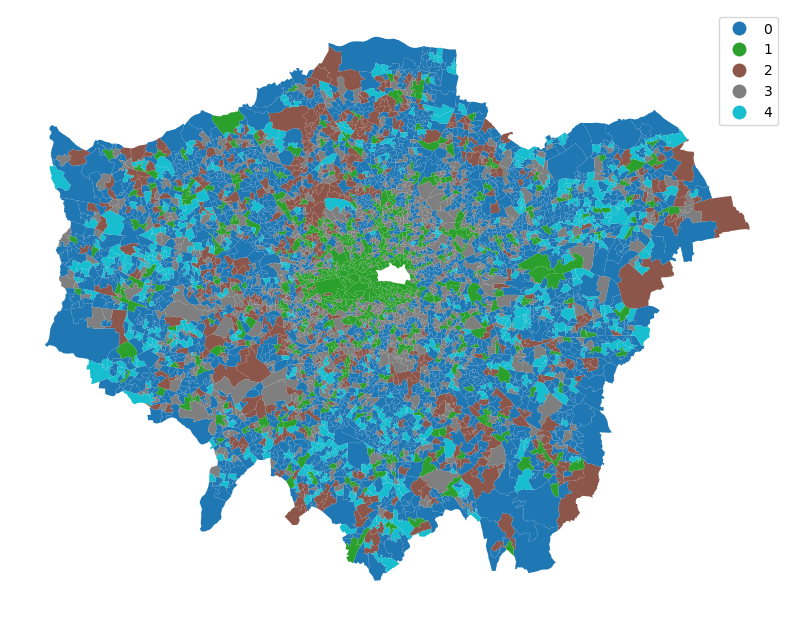

In [223]:
model4_7 = AgglomerativeClustering(linkage="ward", distance_threshold = 4.7, n_clusters=None)
#fit the model to the data
model4_7.fit(crime_clus)
london_crime24["Aggl_clus_4_7"] = model4_7.labels_

fig, ax = plt.subplots(figsize = (10,10))

london_crime24.plot(column = "Aggl_clus_4_7", categorical = True, legend=True, ax=ax)

ax.set_axis_off()

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\877069399.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\877069399.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\877069399.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\877069399.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labe

Text(0.5, 0.98, 'Clusters with distance threshold 4.7')

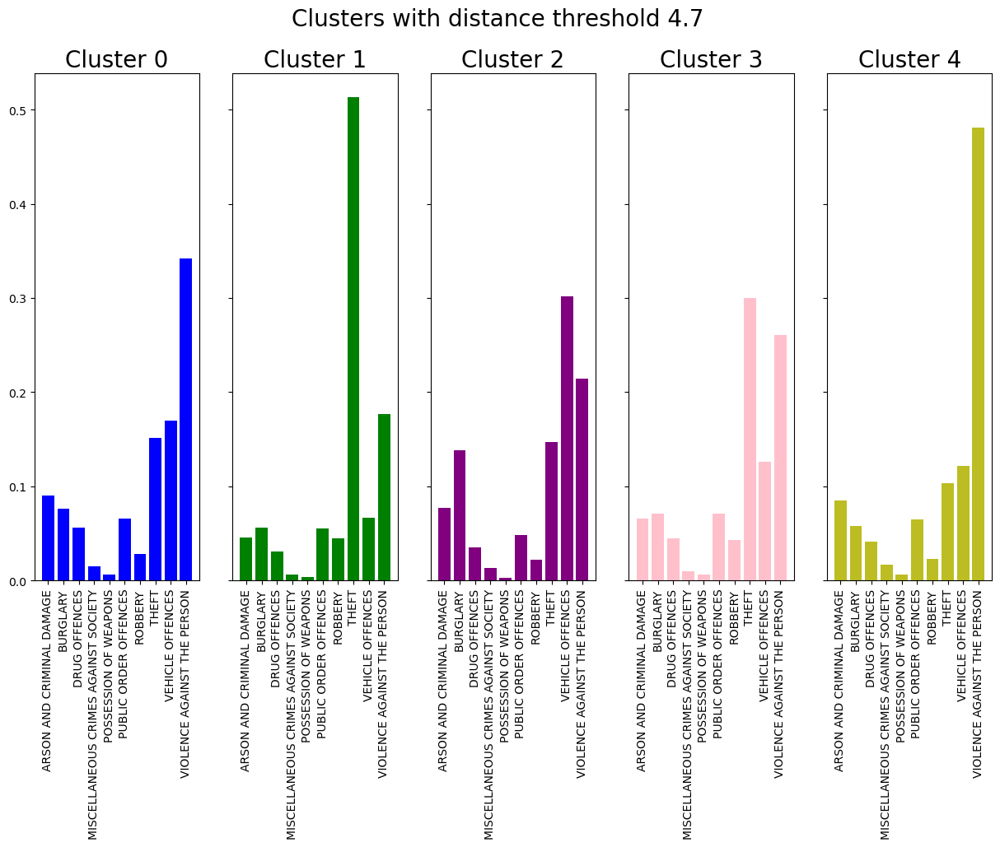

In [226]:
agglom_means =london_crime24.groupby("Aggl_clus_4_7")[cols_to_sum].mean()
agglom_means_T = agglom_means.T.round(3)

agglom_means_T = pd.DataFrame(agglom_means_T)

agglom_means_T.reset_index(inplace=True)

colors = ["blue", "green", "purple", "pink", "tab:olive"]

fig, ax = plt.subplots(1,5, figsize = (15,8), sharey = True, sharex = True)
axis = ax.flatten()
for i, col  in enumerate(agglom_means_T.columns):
    if col != "index":
        ax = axis[i-1]
        ax.bar(height = agglom_means_T[col], x=agglom_means_T["index"], color = colors[i-1])
        ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
        ax.set_title(f"Cluster {col}", fontsize = 20)
        
plt.suptitle("Clusters with distance threshold 4.7", fontsize = 20)

Text(0.5, 1.0, 'Clusters with distance threshold 3')

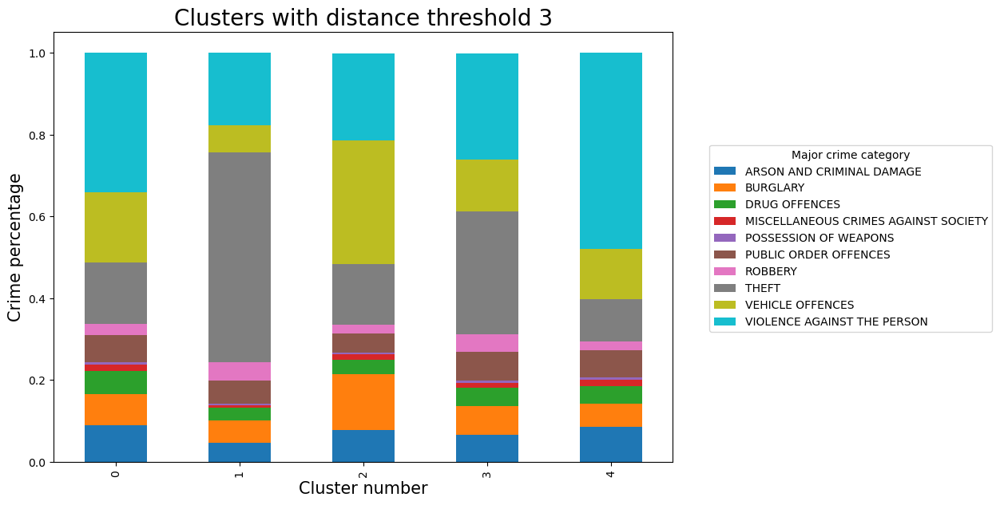

In [227]:
agglom_means =london_crime24.groupby("Aggl_clus_4_7")[cols_to_sum].mean()
agglom_means_T = agglom_means.T.round(3)

agglom_means_T = pd.DataFrame(agglom_means_T)

agglom_means_T.reset_index(inplace=True)

agglom_means_T.set_index('index', inplace=True)
agglom_means_T.rename_axis(None,axis=1, inplace=True)
agglom_means_T.T

fig, ax = plt.subplots(figsize = (10,10))

agglom_plot = agglom_means_T.T.plot.bar(stacked=True, figsize=(10,7), ax=ax)
agglom_plot.legend(title='Major crime category', bbox_to_anchor=(1.05, 0.75), loc='upper left')
ax.set_xlabel("Cluster number", fontsize = 15)
ax.set_ylabel("Crime percentage", fontsize = 15)
ax.set_title("Clusters with distance threshold 3", fontsize = 20)

In [228]:
agglom_sizes = london_crime24.groupby("Aggl_clus_4_7").size()
agglom_sizes

Aggl_clus_4_7
0    2276
1     645
2     560
3     934
4     573
dtype: int64

In [275]:
london_crime24.head()

,lsoa21cd,lsoa21nm,geometry,area_km2,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,...,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime,crime_per_km2,Aggl_clus,Aggl_clus_4_7,crime_per_km2_standardized,crime_density_category,PCA_KMeans_Cluster
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537,0.0562,0.0225,0.0337,0.0225,0.0225,0.0674,...,0.1461,0.2360,0.3258,89.0,607.355157,0,0,-0.263124,Medium-Low,0
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.200094,0.0614,0.0422,0.1209,0.0038,0.0077,0.0806,...,0.2649,0.0307,0.2994,521.0,2603.776320,3,3,1.150185,Very High,3
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.216901,0.0741,0.0296,0.0444,0.0000,0.0000,0.0519,...,0.1407,0.1630,0.4519,135.0,622.402640,0,4,-0.252472,Medium-Low,1
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.127960,0.0988,0.0494,0.0617,0.0123,0.0082,0.0494,...,0.2387,0.0905,0.3333,243.0,1899.032024,0,0,0.651281,High,0
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.091632,0.0957,0.0435,0.0696,0.0348,0.0000,0.0435,...,0.1304,0.0696,0.4696,115.0,1255.016224,0,4,0.195369,Medium-High,1


In [232]:
# 计算每个聚类的均值、标准差、中位数
group_stats = london_crime24.groupby("Aggl_clus_4_7")["crime_per_km2"].describe()
print(group_stats)

                count         mean          std        min          25%  \
Aggl_clus_4_7                                                             
0              2276.0   664.517924   561.636251   7.249097   270.175942   
1               645.0  2717.506992  3004.263095  58.007982  1058.229036   
2               560.0   360.048403   386.789302   7.068130   127.011720   
3               934.0  1152.724561   857.860258  26.104472   524.342930   
4               573.0   593.278266   512.422950  23.338203   269.679164   

                       50%          75%           max  
Aggl_clus_4_7                                          
0               503.235871   913.443979   5307.069805  
1              1939.007822  3588.029570  40345.318556  
2               230.158658   453.634782   3749.758516  
3               973.747903  1527.799086   6023.348331  
4               467.842329   716.135451   4454.547344  


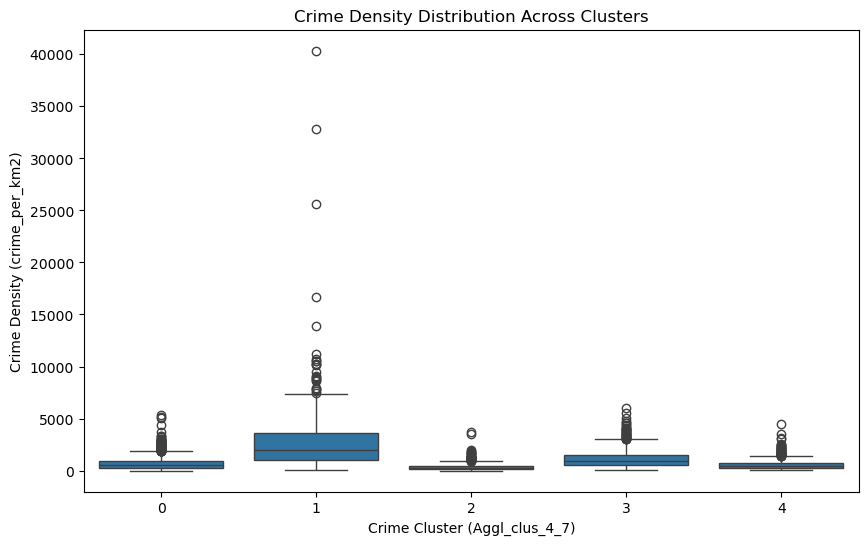

In [233]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="Aggl_clus_4_7", y="crime_per_km2", data=london_crime24)
plt.xlabel("Crime Cluster (Aggl_clus_4_7)")
plt.ylabel("Crime Density (crime_per_km2)")
plt.title("Crime Density Distribution Across Clusters")
plt.show()

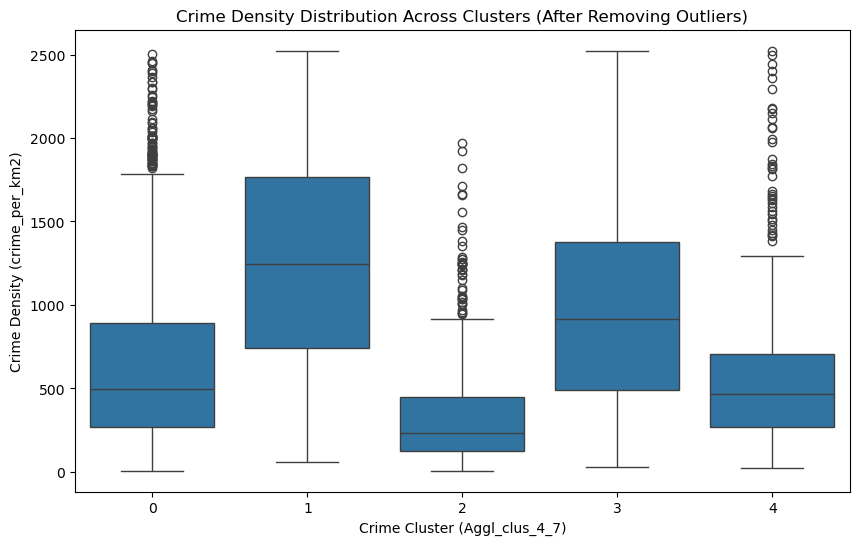

In [241]:
Q1 = london_crime24['crime_per_km2'].quantile(0.25)
Q3 = london_crime24['crime_per_km2'].quantile(0.75)
IQR = Q3 - Q1

filtered_data = london_crime24[
    (london_crime24['crime_per_km2'] >= (Q1 - 1.5 * IQR)) & (london_crime24['crime_per_km2'] <= (Q3 + 1.5 * IQR))
]

plt.figure(figsize=(10, 6))
sns.boxplot(x="Aggl_clus_4_7", y="crime_per_km2", data=filtered_data)
plt.xlabel("Crime Cluster (Aggl_clus_4_7)")
plt.ylabel("Crime Density (crime_per_km2)")
plt.title("Crime Density Distribution Across Clusters (After Removing Outliers)")
plt.show()


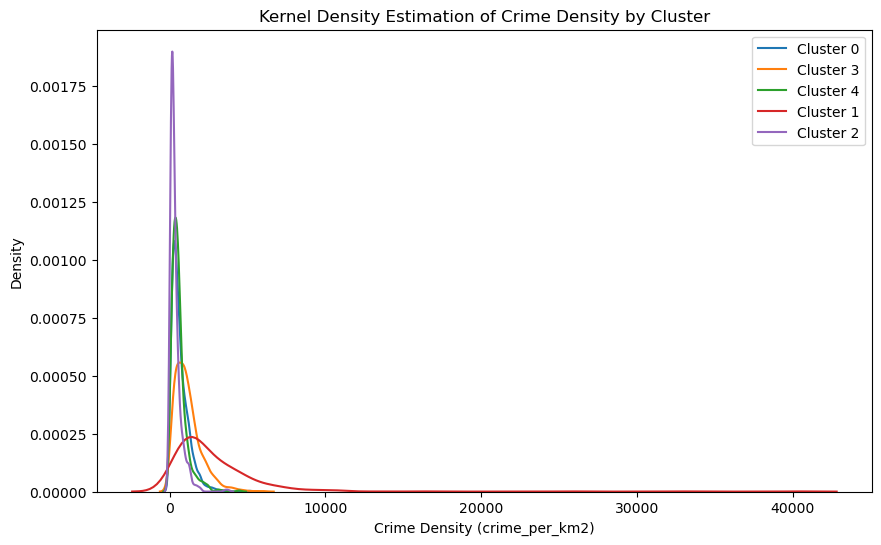

In [234]:
plt.figure(figsize=(10, 6))
for cluster in london_crime24["Aggl_clus_4_7"].unique():
    sns.kdeplot(london_crime24[london_crime24["Aggl_clus_4_7"] == cluster]["crime_per_km2"], label=f"Cluster {cluster}")

plt.xlabel("Crime Density (crime_per_km2)")
plt.ylabel("Density")
plt.title("Kernel Density Estimation of Crime Density by Cluster")
plt.legend()
plt.show()

In [235]:
from scipy.stats import f_oneway

groups = [london_crime24[london_crime24["Aggl_clus_4_7"] == cluster]["crime_per_km2"] for cluster in london_crime24["Aggl_clus_4_7"].unique()]
anova_result = f_oneway(*groups)
print("ANOVA F-value:", anova_result.statistic)
print("ANOVA p-value:", anova_result.pvalue)


ANOVA F-value: 418.428402500764
ANOVA p-value: 2.780655208445e-311


In [240]:
from scipy.stats import spearmanr

correlation, p_value = spearmanr(london_crime24["Aggl_clus_4_7"], london_crime24["crime_per_km2"])
print(f"Spearman correlation: {correlation:.3f}, p-value: {p_value:.3f}")

Spearman correlation: 0.081, p-value: 0.000


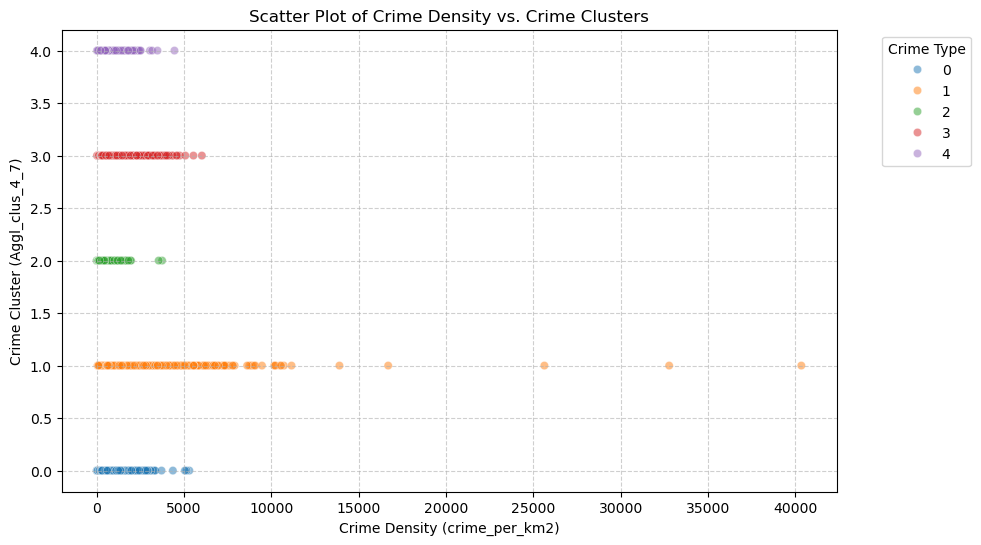

In [238]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# 绘制散点图，设置透明度 alpha=0.5，避免过度重叠
sns.scatterplot(
    data=london_crime24, 
    y="Aggl_clus_4_7", 
    x="crime_per_km2", 
    hue="Aggl_clus_4_7",  # 按犯罪类型分色
    alpha=0.5,  # 设置透明度
    palette="tab10"  # 颜色方案
)

plt.ylabel("Crime Cluster (Aggl_clus_4_7)")
plt.xlabel("Crime Density (crime_per_km2)")
plt.title("Scatter Plot of Crime Density vs. Crime Clusters")
plt.legend(title="Crime Type", bbox_to_anchor=(1.05, 1), loc="upper left")  # 调整图例位置
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()


In [303]:
london_crime24.head()

,lsoa21cd,lsoa21nm,geometry,area_km2,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,...,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime,crime_per_km2,Aggl_clus,Aggl_clus_4_7,crime_per_km2_standardized,crime_density_category,PCA_KMeans_Cluster
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537,0.0562,0.0225,0.0337,0.0225,0.0225,0.0674,...,0.1461,0.2360,0.3258,89.0,607.355157,0,0,-0.263124,Medium-Low,0
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.200094,0.0614,0.0422,0.1209,0.0038,0.0077,0.0806,...,0.2649,0.0307,0.2994,521.0,2603.776320,3,3,1.150185,Very High,3
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.216901,0.0741,0.0296,0.0444,0.0000,0.0000,0.0519,...,0.1407,0.1630,0.4519,135.0,622.402640,0,4,-0.252472,Medium-Low,1
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.127960,0.0988,0.0494,0.0617,0.0123,0.0082,0.0494,...,0.2387,0.0905,0.3333,243.0,1899.032024,0,0,0.651281,High,0
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.091632,0.0957,0.0435,0.0696,0.0348,0.0000,0.0435,...,0.1304,0.0696,0.4696,115.0,1255.016224,0,4,0.195369,Medium-High,1


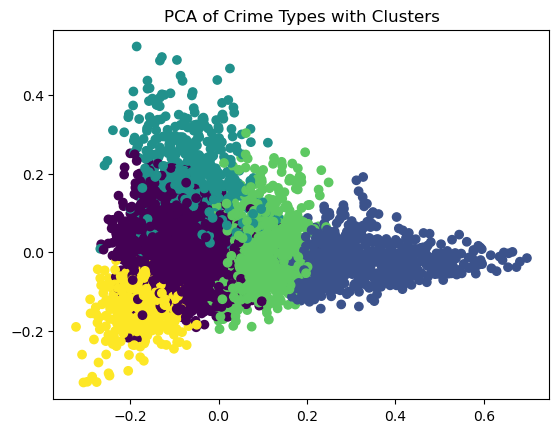

In [261]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
crime_features = london_crime24[cols_to_sum]
principal_components = pca.fit_transform(crime_features)

# 可视化PCA结果与聚类类型
plt.scatter(principal_components[:, 0], principal_components[:, 1], c=london_crime24['Aggl_clus_4_7'])
plt.title("PCA of Crime Types with Clusters")
plt.show()


In [262]:
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")

Explained variance ratio: [0.58448757 0.23936248 0.06064577]


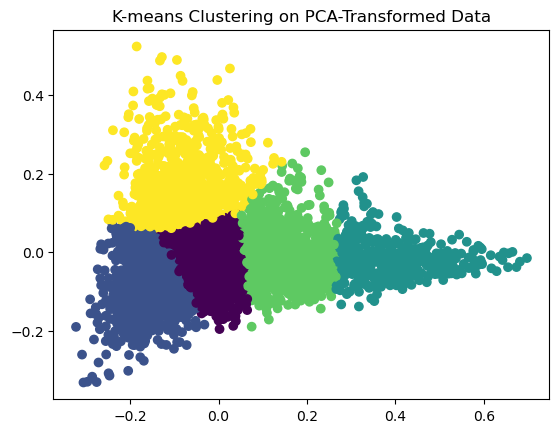

In [267]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# 选择你要聚类的特征（多个犯罪类型的特征）
crime_features = london_crime24[cols_to_sum]

# 应用PCA降维（假设选择前两个主成分）
pca = PCA(n_components=2)
principal_components = pca.fit_transform(crime_features)

# 聚类分析（使用K-means）
kmeans = KMeans(n_clusters=5)  # 假设你选择了5个聚类
kmeans.fit(principal_components)

# 获取每个样本的聚类标签
london_crime24['PCA_KMeans_Cluster'] = kmeans.labels_

# 可视化聚类结果
plt.scatter(principal_components[:, 0], principal_components[:, 1], c=london_crime24['PCA_KMeans_Cluster'])
plt.title("K-means Clustering on PCA-Transformed Data")
plt.show()


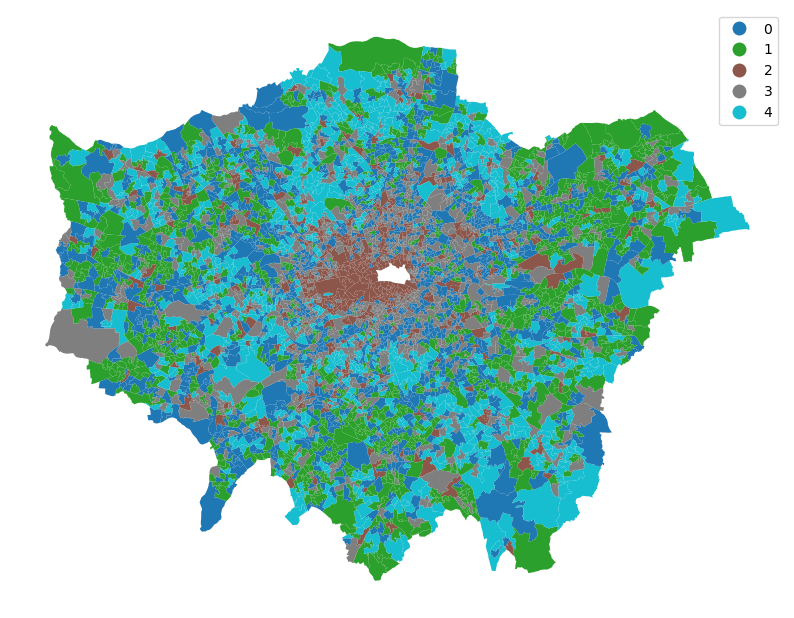

In [273]:
fig, ax = plt.subplots(figsize = (10,10))

colors = ["blue", "green", "purple", "pink", "tab:olive"]
london_crime24.plot(column = "PCA_KMeans_Cluster", categorical = True, legend=True, ax=ax)

ax.set_axis_off()

C:\Users\YU\AppData\Local\Temp\ipykernel_43784\498361525.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\498361525.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\498361525.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
C:\Users\YU\AppData\Local\Temp\ipykernel_43784\498361525.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labe

Text(0.5, 0.98, 'PCA_KMeans_Cluster')

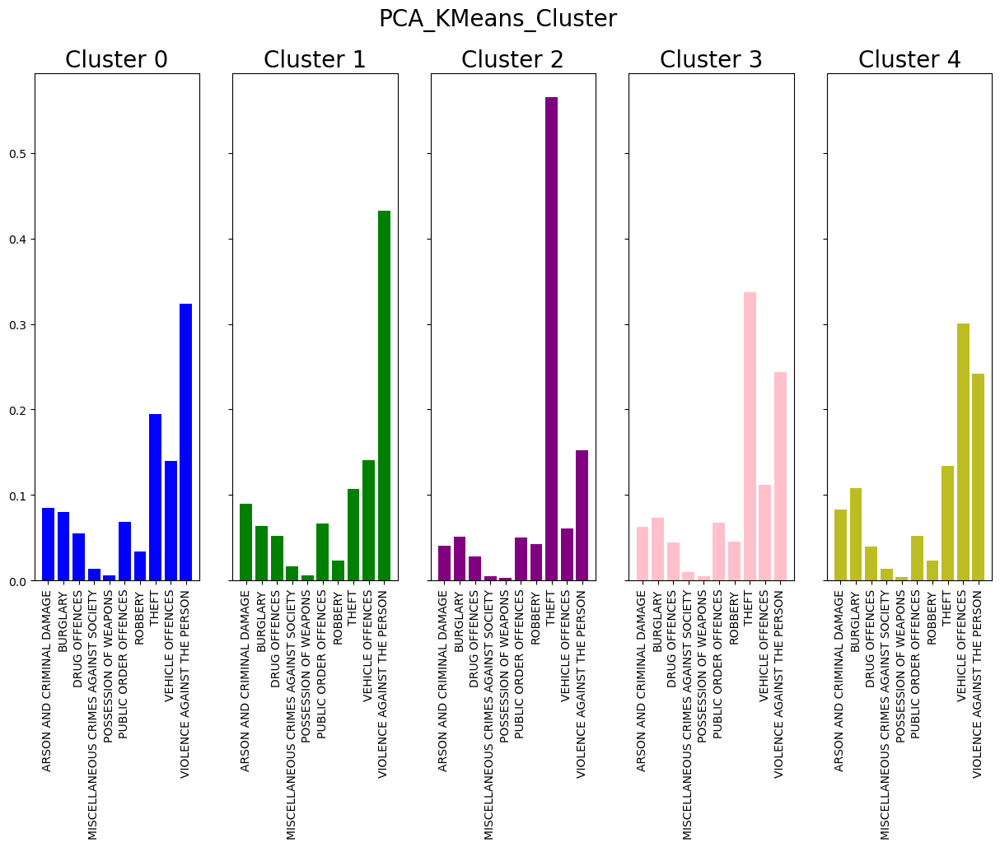

In [274]:
agglom_means =london_crime24.groupby("PCA_KMeans_Cluster")[cols_to_sum].mean()
agglom_means_T = agglom_means.T.round(3)

agglom_means_T = pd.DataFrame(agglom_means_T)

agglom_means_T.reset_index(inplace=True)

colors = ["blue", "green", "purple", "pink", "tab:olive"]

fig, ax = plt.subplots(1,5, figsize = (15,8), sharey = True, sharex = True)
axis = ax.flatten()
for i, col  in enumerate(agglom_means_T.columns):
    if col != "index":
        ax = axis[i-1]
        ax.bar(height = agglom_means_T[col], x=agglom_means_T["index"], color = colors[i-1])
        ax.set_xticklabels(labels =agglom_means_T["index"], rotation = 90)
        ax.set_title(f"Cluster {col}", fontsize = 20)
        
plt.suptitle("PCA_KMeans_Cluster", fontsize = 20)

In [269]:
london_crime24.head()

,lsoa21cd,lsoa21nm,geometry,area_km2,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,...,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime,crime_per_km2,Aggl_clus,Aggl_clus_4_7,crime_per_km2_standardized,crime_density_category,PCA_KMeans_Cluster
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537,0.0562,0.0225,0.0337,0.0225,0.0225,0.0674,...,0.1461,0.2360,0.3258,89.0,607.355157,0,0,-0.263124,Medium-Low,0
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.200094,0.0614,0.0422,0.1209,0.0038,0.0077,0.0806,...,0.2649,0.0307,0.2994,521.0,2603.776320,3,3,1.150185,Very High,3
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.216901,0.0741,0.0296,0.0444,0.0000,0.0000,0.0519,...,0.1407,0.1630,0.4519,135.0,622.402640,0,4,-0.252472,Medium-Low,1
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.127960,0.0988,0.0494,0.0617,0.0123,0.0082,0.0494,...,0.2387,0.0905,0.3333,243.0,1899.032024,0,0,0.651281,High,0
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.091632,0.0957,0.0435,0.0696,0.0348,0.0000,0.0435,...,0.1304,0.0696,0.4696,115.0,1255.016224,0,4,0.195369,Medium-High,1


In [264]:
from scipy.stats import chi2_contingency

# 将`crime_per_km2`划分为类别
bins = [0, 500, 1000, 1500, 2000, np.inf]
labels = ['Low', 'Medium-Low', 'Medium-High', 'High', 'Very High']
london_crime24['crime_density_category'] = pd.cut(london_crime24['crime_per_km2'], bins=bins, labels=labels)

# 卡方检验
contingency_table = pd.crosstab(london_crime24['Aggl_clus_4_7'], london_crime24['crime_density_category'])
chi2, p, _, _ = chi2_contingency(contingency_table)
print("Chi-Square p-value:", p)
print("Chi-Square Statistic:", chi2)
print("Degrees of Freedom:", len(contingency_table) - 1)
print("Contingency Table:\n", contingency_table)


Chi-Square p-value: 0.0
Chi-Square Statistic: 1863.9110954419439
Degrees of Freedom: 4
Contingency Table:
 crime_density_category   Low  Medium-Low  Medium-High  High  Very High
Aggl_clus_4_7                                                         
0                       1134         652          306   122         62
1                         52          94           99    85        315
2                        435          87           29     7          2
3                        220         264          209   106        135
4                        312         183           43    19         16


In [242]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
london_crime24['crime_per_km2_standardized'] = scaler.fit_transform(london_crime24[['crime_per_km2']])


In [248]:
group_stats = london_crime24.groupby("Aggl_clus_4_7")["crime_per_km2_standardized"].describe()
print(group_stats)

                count      mean       std       min       25%       50%  \
Aggl_clus_4_7                                                             
0              2276.0 -0.222657  0.397594 -0.687952 -0.501820 -0.336832   
1               645.0  1.230697  2.126781 -0.652018  0.056059  0.679581   
2               560.0 -0.438198  0.273816 -0.688080 -0.603169 -0.530149   
3               934.0  0.122954  0.607297 -0.674604 -0.321890 -0.003747   
4               573.0 -0.273089  0.362755 -0.676562 -0.502172 -0.361888   

                    75%        max  
Aggl_clus_4_7                       
0             -0.046437   3.063903  
1              1.846958  27.868217  
2             -0.371946   1.961449  
3              0.388478   3.570972  
4             -0.186116   2.460384  


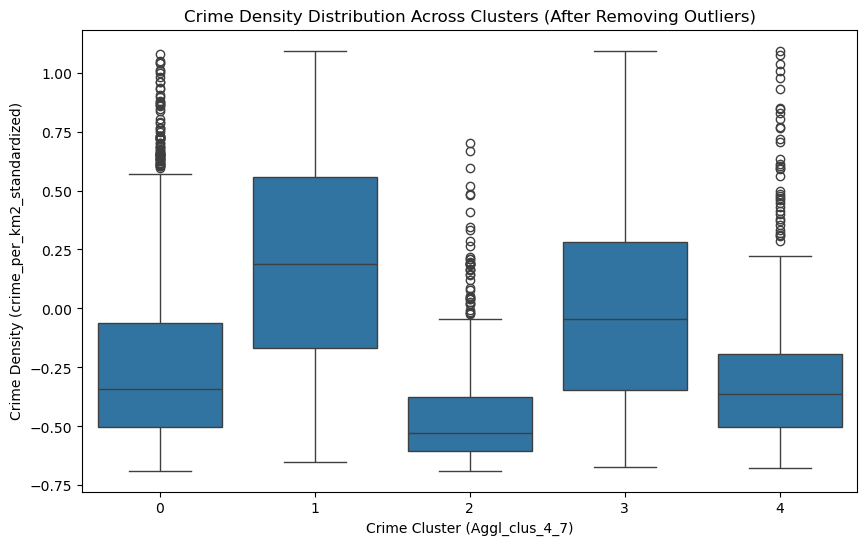

In [251]:
Q1 = london_crime24['crime_per_km2_standardized'].quantile(0.25)
Q3 = london_crime24['crime_per_km2_standardized'].quantile(0.75)
IQR = Q3 - Q1

filtered_data = london_crime24[
    (london_crime24['crime_per_km2_standardized'] >= (Q1 - 1.5 * IQR)) & (london_crime24['crime_per_km2_standardized'] <= (Q3 + 1.5 * IQR))
]

plt.figure(figsize=(10, 6))
sns.boxplot(x="Aggl_clus_4_7", y="crime_per_km2_standardized", data=filtered_data)
plt.xlabel("Crime Cluster (Aggl_clus_4_7)")
plt.ylabel("Crime Density (crime_per_km2_standardized)")
plt.title("Crime Density Distribution Across Clusters (After Removing Outliers)")
plt.show()


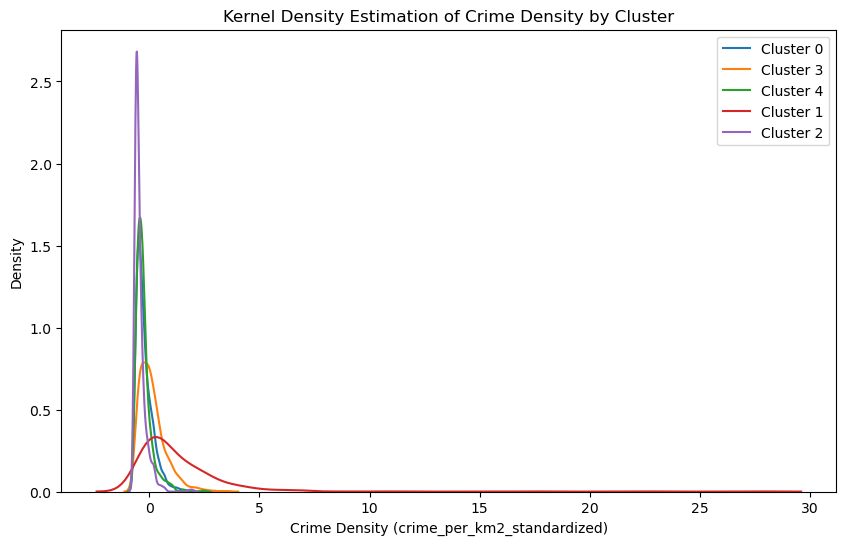

In [252]:
plt.figure(figsize=(10, 6))
for cluster in london_crime24["Aggl_clus_4_7"].unique():
    sns.kdeplot(london_crime24[london_crime24["Aggl_clus_4_7"] == cluster]["crime_per_km2_standardized"], label=f"Cluster {cluster}")

plt.xlabel("Crime Density (crime_per_km2_standardized)")
plt.ylabel("Density")
plt.title("Kernel Density Estimation of Crime Density by Cluster")
plt.legend()
plt.show()